In [1]:
import warnings

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.auto import tqdm

sns.set(style="ticks", palette="muted", color_codes=True)

warnings.filterwarnings("ignore")

plt.rcParams['axes.labelsize'] = 15
plt.rcParams['axes.titlesize'] = 20

seed = 42

In [2]:
def show_tbl(df):
    return qgrid.showgrid(df, show_toolbar=True)

In [3]:
df = pd.read_csv("Combined_all_air_pollut_types&coords.csv", parse_dates=['DATE'])

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 542322 entries, 0 to 542321
Data columns (total 12 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   DATE                    542322 non-null  datetime64[ns]
 1   POLSTID                 542322 non-null  object        
 2   Voivodeship             542322 non-null  object        
 3   City                    542322 non-null  object        
 4   county                  542322 non-null  object        
 5   postcode                542322 non-null  object        
 6   LAT                     542322 non-null  float64       
 7   LON                     542322 non-null  float64       
 8   NO2_24H_AVG_POLLUTION   5035 non-null    float64       
 9   O3_24H_AVG_POLLUTION    184172 non-null  float64       
 10  PM10_24H_AVG_POLLUTION  303605 non-null  float64       
 11  PM25_24H_AVG_POLLUTION  113597 non-null  float64       
dtypes: datetime64[ns](1), float64(

In [5]:
df.isnull().sum()

DATE                           0
POLSTID                        0
Voivodeship                    0
City                           0
county                         0
postcode                       0
LAT                            0
LON                            0
NO2_24H_AVG_POLLUTION     537287
O3_24H_AVG_POLLUTION      358150
PM10_24H_AVG_POLLUTION    238717
PM25_24H_AVG_POLLUTION    428725
dtype: int64

In [6]:
df.columns

Index(['DATE', 'POLSTID', 'Voivodeship', 'City', 'county', 'postcode', 'LAT',
       'LON', 'NO2_24H_AVG_POLLUTION', 'O3_24H_AVG_POLLUTION',
       'PM10_24H_AVG_POLLUTION', 'PM25_24H_AVG_POLLUTION'],
      dtype='object')

In [7]:
for col in ['POLSTID', 'Voivodeship', 'City', 'county', 'postcode']:
    print(f"{col} : Total unique categories: {len(set(df[col]))}")

POLSTID : Total unique categories: 297
Voivodeship : Total unique categories: 16
City : Total unique categories: 225
county : Total unique categories: 197
postcode : Total unique categories: 271


# Preliminary EDA

Number of stations that does not record PM10 pollutant = 66


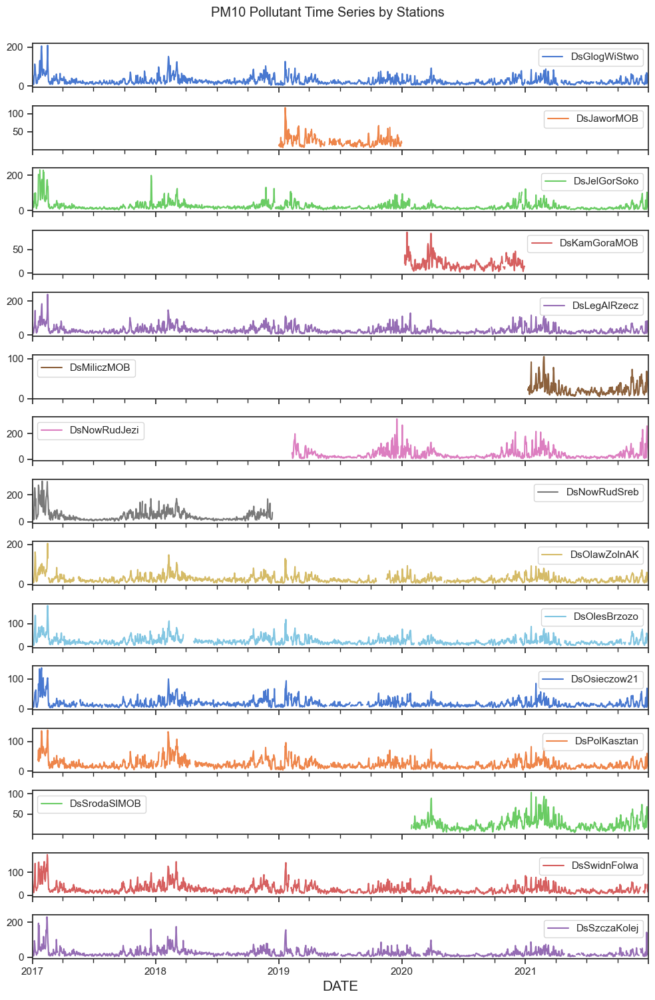

In [8]:
#Creaing a list of station that does not measure PM10
non_pm10_stations = \
df.groupby('POLSTID')['PM10_24H_AVG_POLLUTION'].mean()\
[pd.isnull(df.groupby('POLSTID')['PM10_24H_AVG_POLLUTION'].mean())].index

print(f'Number of stations that does not record PM10 pollutant = {len(non_pm10_stations)}')

#Filtering out those stations that does not measure PM10 and then plotting
df.loc[~df['POLSTID'].isin(non_pm10_stations)].\
    groupby(['POLSTID', 'DATE'])['PM10_24H_AVG_POLLUTION'].mean().\
        unstack('POLSTID').iloc[:, :15].\
            plot(subplots=True, figsize=(10, 15));

plt.suptitle("PM10 Pollutant Time Series by Stations",  y=1)
plt.tight_layout()

Some stations have incomplete readings. Some stations seems to take measurements after a certain time periods.

Number of stations that does not record NO2 pollutant = 294


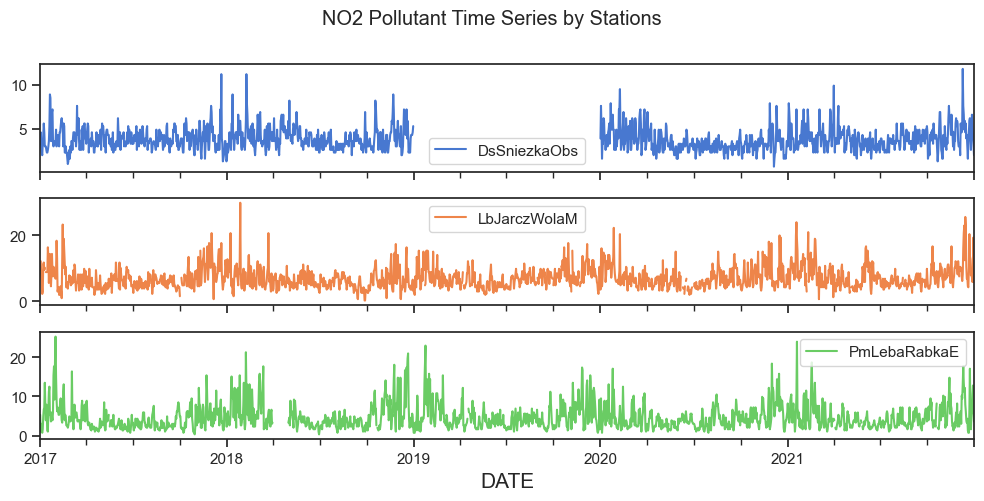

In [9]:
#Creaing a list of station that does not measure NO2
non_no2_stations = \
df.groupby('POLSTID')['NO2_24H_AVG_POLLUTION'].mean()\
[pd.isnull(df.groupby('POLSTID')['NO2_24H_AVG_POLLUTION'].mean())].index

print(f'Number of stations that does not record NO2 pollutant = {len(non_no2_stations)}')

df.loc[~df['POLSTID'].isin(non_no2_stations)].\
    groupby(['POLSTID', 'DATE'])['NO2_24H_AVG_POLLUTION'].mean().\
        unstack('POLSTID').plot(subplots=True, figsize=(10, 5));

plt.suptitle("NO2 Pollutant Time Series by Stations",  y=1)
plt.tight_layout()

The first station has no measurements for the year of 2019.  Other stations have small gaps in data too.

Number of stations that does not record O3 pollutant = 172


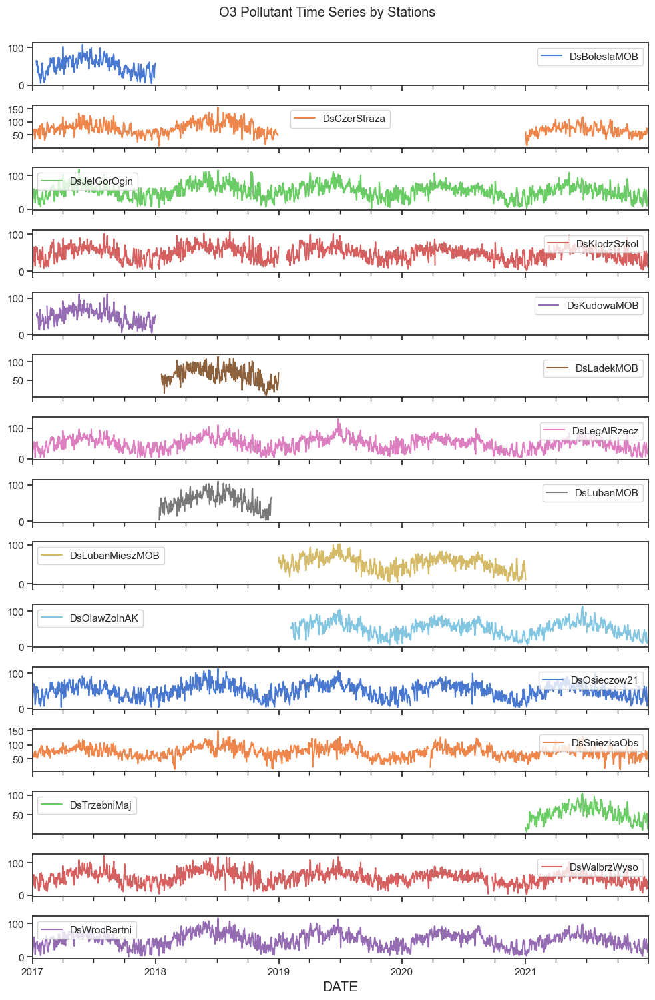

In [10]:
#Creaing a list of station that does not measure O3
non_o3_stations = \
df.groupby('POLSTID')['O3_24H_AVG_POLLUTION'].mean()\
[pd.isnull(df.groupby('POLSTID')['O3_24H_AVG_POLLUTION'].mean())].index

print(f'Number of stations that does not record O3 pollutant = {len(non_o3_stations)}')

df.loc[~df['POLSTID'].isin(non_o3_stations)].\
    groupby(['POLSTID', 'DATE'])['O3_24H_AVG_POLLUTION'].mean().\
        unstack('POLSTID').iloc[:, :15].\
            plot(subplots=True, figsize=(10, 15));

plt.suptitle("O3 Pollutant Time Series by Stations",  y=1)
plt.tight_layout()

Similar to Pm10 stations - many incomplete measurements.

Number of stations that does not record PM25 pollutant = 217


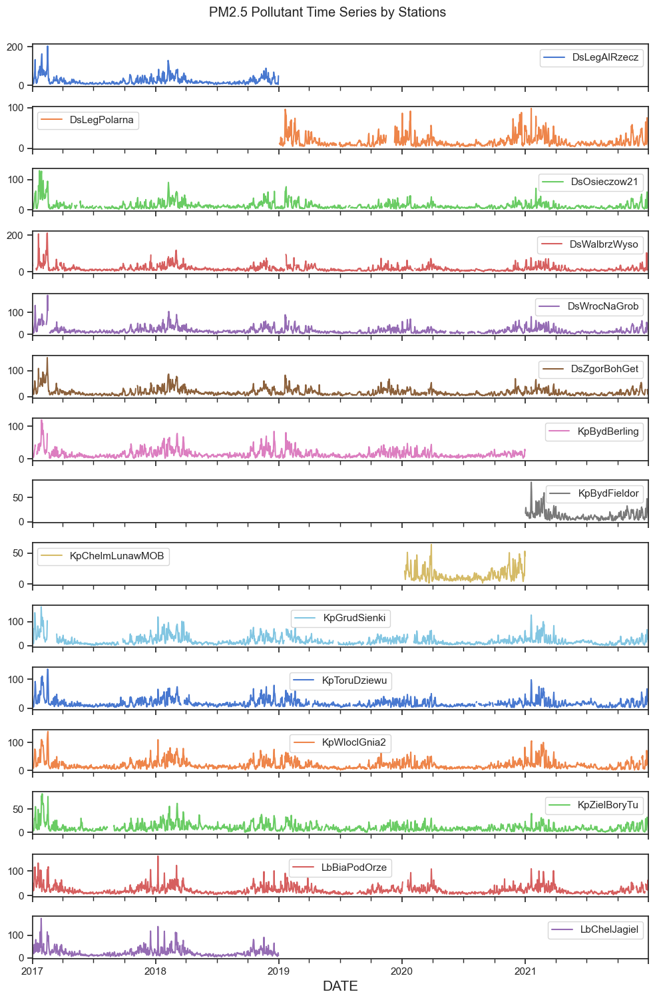

In [11]:
#Creaing a list of station that does not measure PM2.5
non_pm25_stations = \
df.groupby('POLSTID')['PM25_24H_AVG_POLLUTION'].mean()\
[pd.isnull(df.groupby('POLSTID')['PM25_24H_AVG_POLLUTION'].mean())].index

print(f'Number of stations that does not record PM25 pollutant = {len(non_pm25_stations)}')

df.loc[~df['POLSTID'].isin(non_pm25_stations)].\
    groupby(['POLSTID', 'DATE'])['PM25_24H_AVG_POLLUTION'].mean().\
        unstack('POLSTID').iloc[:, :15].\
            plot(subplots=True, figsize=(10, 15));

plt.suptitle("PM2.5 Pollutant Time Series by Stations",  y=1)
plt.tight_layout()

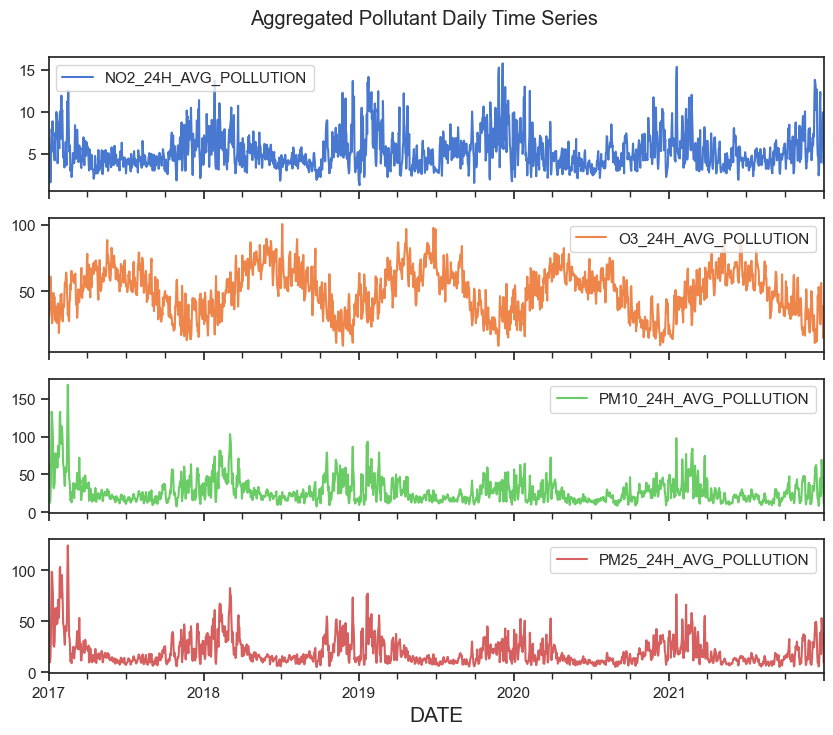

In [12]:
#Aggregating all stations and taking the mean to see overall patterns in pollution.

df.groupby('DATE')[[
    'NO2_24H_AVG_POLLUTION', 
    'O3_24H_AVG_POLLUTION', 
    'PM10_24H_AVG_POLLUTION', 
    'PM25_24H_AVG_POLLUTION'
]].mean().plot(subplots=True, figsize=(10, 8));

plt.suptitle("Aggregated Pollutant Daily Time Series",  y=0.94);

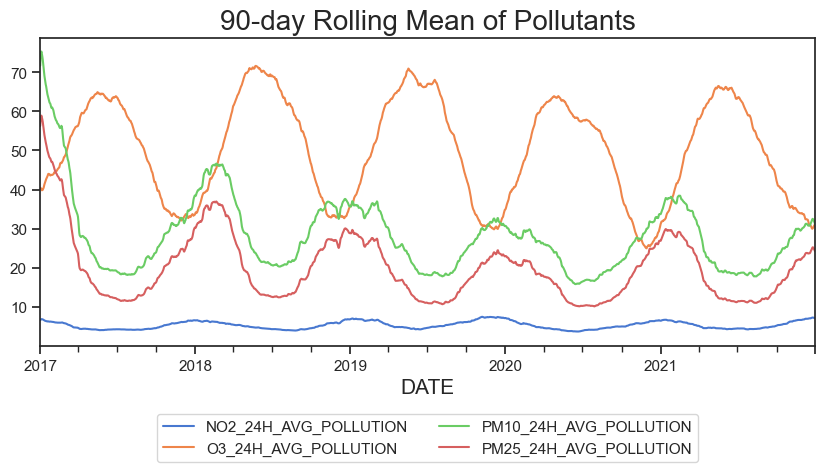

In [13]:
ax = \
df.groupby('DATE')[[
    'NO2_24H_AVG_POLLUTION', 
    'O3_24H_AVG_POLLUTION', 
    'PM10_24H_AVG_POLLUTION', 
    'PM25_24H_AVG_POLLUTION'
]].mean().rolling(90, center=True, min_periods=30).mean().\
    plot(figsize=(10, 4), title = "90-day Rolling Mean of Pollutants")

ax.legend(ncol=2, loc='center', bbox_to_anchor=(0.5, -0.3));

NO2, PM10 and PM25 seems to have same pattern whereas O3 has the opposite pattern.

In [14]:
#Extracting day, month, year and dayofweek features from DATE

df['day'] = df['DATE'].dt.day
df['month'] = df['DATE'].dt.month
df['year'] = df['DATE'].dt.year
df['dayofweek'] = df['DATE'].dt.dayofweek

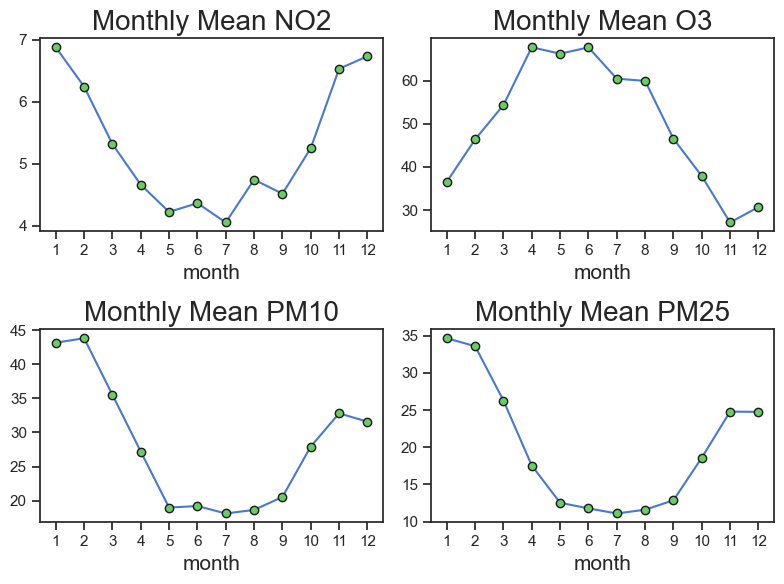

In [15]:
#Checking for monthly seasonality pattern
pollutant_cols = ['NO2_24H_AVG_POLLUTION', 'O3_24H_AVG_POLLUTION', 'PM10_24H_AVG_POLLUTION', 
                  'PM25_24H_AVG_POLLUTION']

fig, axes = plt.subplots(2, 2, tight_layout=True, figsize=(8, 6))

for col, ax in zip(pollutant_cols, axes.flatten()):
    
    df.groupby('month')[col].mean().plot(ax=ax, marker="o", mfc="g", mec="k")
    ax.set_xticks(np.arange(1, 13, 1))
    ax.set_title(f'Monthly Mean {col.split("_")[0]}');

O3 seems to be highest during summer and lowest during winter. The opposite is true for the other pollutants. Will need to compare with weather data to understand patterns.

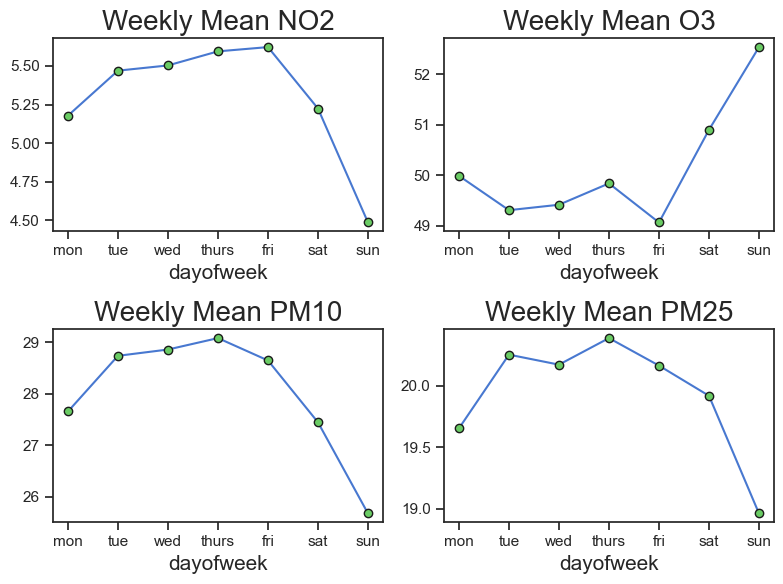

In [16]:
#Checking for weekly seasonality
days=["mon", "tue", "wed", "thurs", "fri", "sat", "sun"]

fig, axes = plt.subplots(2, 2, tight_layout=True, figsize=(8, 6))

for col, ax in zip(pollutant_cols, axes.flatten()):
    
    df.groupby('dayofweek')[col].mean().plot(ax=ax, marker="o", mfc="g", mec="k")
    ax.set_xticks(np.arange(7), days)
    ax.set_title(f'Weekly Mean {col.split("_")[0]}');

For O3, measurements are higher during the weekends and lower during working days. Where as the other pollutants shows the opposite patterns. This is an interesting observation. Perhaps, this shows that pollution depends on the number of cars on the roads? Will need to look deeper into this.

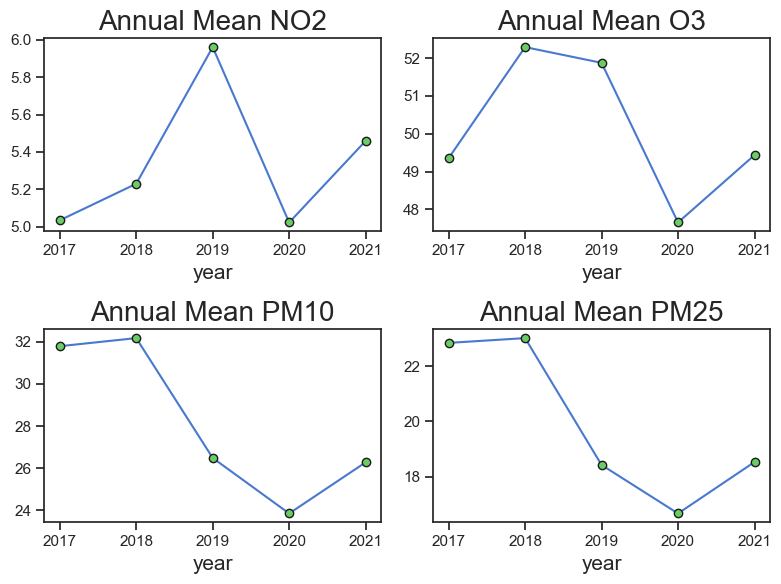

In [17]:
#Yearly Seasonality
fig, axes = plt.subplots(2, 2, tight_layout=True, figsize=(8, 6))

for col, ax in zip(pollutant_cols, axes.flatten()):
    
    df.groupby('year')[col].mean().plot(ax=ax, marker="o", mfc="g", mec="k")
    ax.set_title(f'Annual Mean {col.split("_")[0]}');

All pollutants seems to have dropped during 2020. This could be attributed to COVID19.

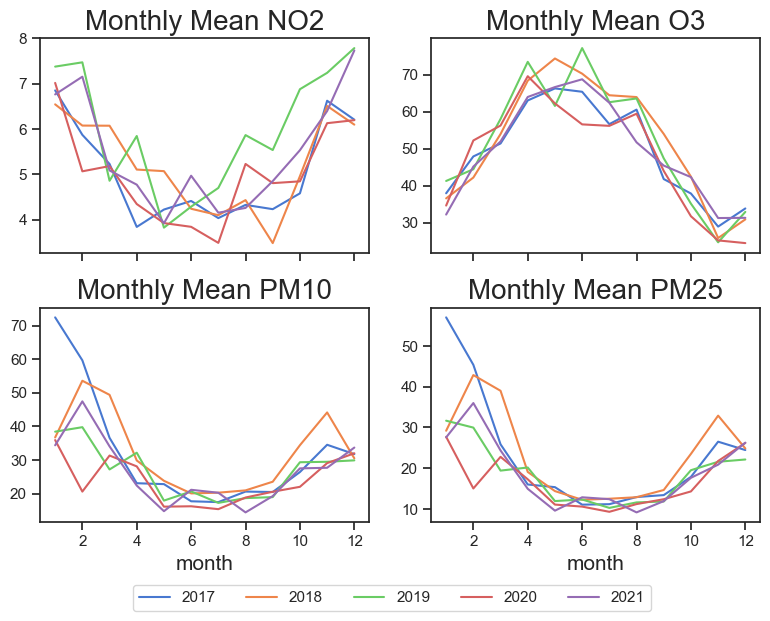

In [18]:
#Checking for monthly seasonality for each year.
fig, axes = plt.subplots(2, 2, tight_layout=True, figsize=(8, 6), sharex=True)

for col, ax in zip(pollutant_cols, axes.flatten()):
    df.groupby(['year', 'month'])[pollutant_cols].mean().unstack('year')[col].\
        plot(ax=ax, title=f"Monthly Mean {col.split('_')[0]}", legend=None)
    
fig.legend(labels=df['year'].unique(), loc='center', bbox_to_anchor=(0.5,-0.01), ncol=5, 
           bbox_transform=fig.transFigure);

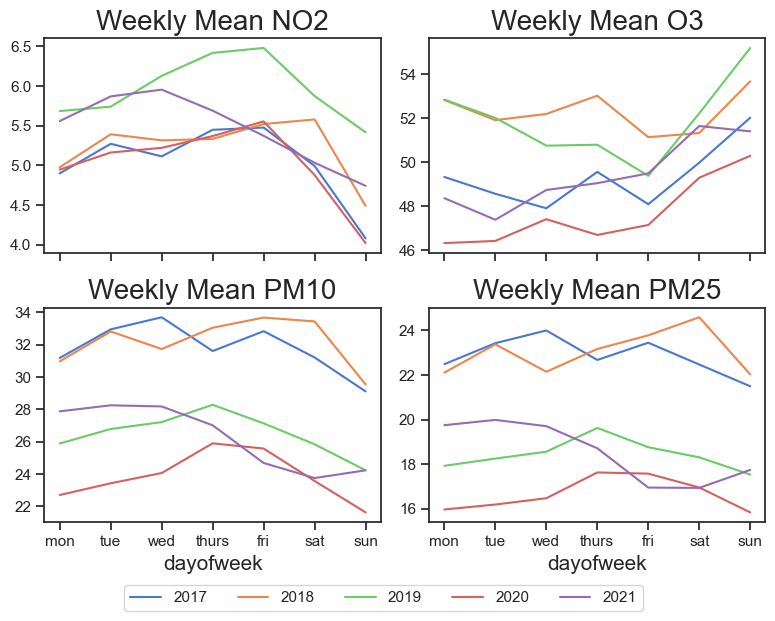

In [19]:
#Checking for weekly seasonality for each year.
fig, axes = plt.subplots(2, 2, tight_layout=True, figsize=(8, 6), sharex=True)

for col, ax in zip(pollutant_cols, axes.flatten()):
    df.groupby(['year', 'dayofweek'])[pollutant_cols].mean().unstack('year')[col].\
        plot(ax=ax, title=f"Weekly Mean {col.split('_')[0]}", legend=None)
    
    ax.set_xticks(np.arange(7), days)
    
fig.legend(labels=df['year'].unique(), loc='center', bbox_to_anchor=(0.5,-0.01), ncol=5, 
           bbox_transform=fig.transFigure);

# NO2 Stations

In [20]:
#Filtering those stations that do not contain NO2 measurements
#Then creating a seperate dataframe for NO2 measurements and where each station is a column
no2_stations=\
df.loc[~df['POLSTID'].isin(non_no2_stations)].\
    groupby(['POLSTID', 'DATE'])['NO2_24H_AVG_POLLUTION'].mean().\
        unstack('POLSTID')

#Setting the date to daily frequency
no2_stations.index.freq='D'

#Only 3 stations measure NO2
no2_stations.head()

POLSTID,DsSniezkaObs,LbJarczWolaM,PmLebaRabkaE
DATE,,,
2017-01-01,3.3,12.2,5.3
2017-01-02,4.6,12.2,1.0
2017-01-03,3.0,8.2,3.0
2017-01-04,2.3,6.2,1.3
2017-01-05,2.0,2.3,0.7


In [21]:
no2_stations.isna().sum()

POLSTID
DsSniezkaObs    365
LbJarczWolaM     34
PmLebaRabkaE     44
dtype: int64

DsSniezkaObs station contains null values for whole 2019. Simply imputation techniques such as linear interpolation, forward fill, back fill, etc. wont suffice. We will need to use more comprehensive imputation techniques.

In [22]:
def plot_simple_impute(df, col, null_val):
    
    ax=df[col].plot(figsize=(10, 3))
    
    df.loc[null_val, col].plot(linestyle='', marker='*', c='red', ax=ax, label='imputed')
    
    df[col].rolling(90, center=True, min_periods=30).mean().plot(ax=ax, label='90-day rolling mean')
    
    ax.legend(ncol=3, loc='upper right')
    
    plt.show();

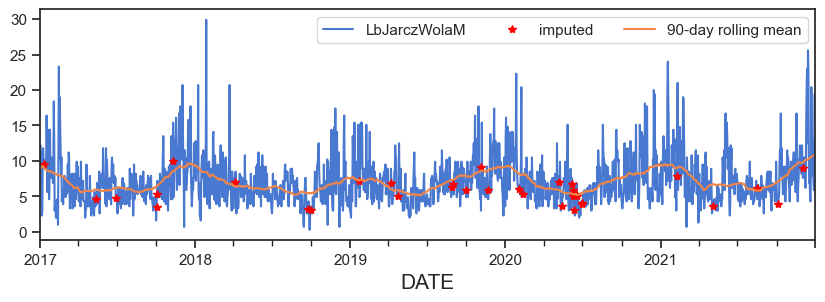

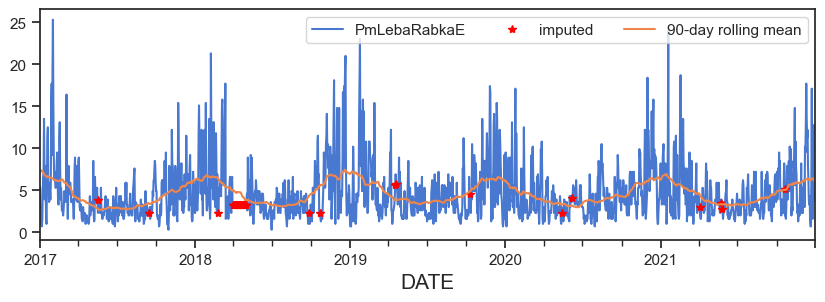

In [23]:
#Imputting other stations using linear interpolation

for col in ['LbJarczWolaM', 'PmLebaRabkaE']:
    
    #Taking indexes that contain null values for plotting purposes
    null_values=no2_stations[col].isnull()
    
    #imputting use linear interpolation
    no2_stations[col]=no2_stations[col].interpolate('linear')
    
    #plotting to show the imputted areas of the Time Series
    plot_simple_impute(df=no2_stations, col=col, null_val=null_values)

As there are only a few gaps here and there in the time series, linear interpolation will suffice for these station.

# Imputation using MSTL  (Season-Trend decomposition using LOESS for multiple seasonalities)

#### Github repo that provides information on STL/MSTL [trainindata Github Repo](https://github.com/trainindata/feature-engineering-for-time-series-forecasting/blob/main/05-Missing-Data/03-impute-missing-data-using-STL-decomposition-and-interpolation.ipynb)

#### Statsmodal documentation on MSTL: [MSTL](https://www.statsmodels.org/dev/generated/statsmodels.tsa.seasonal.MSTL.html)

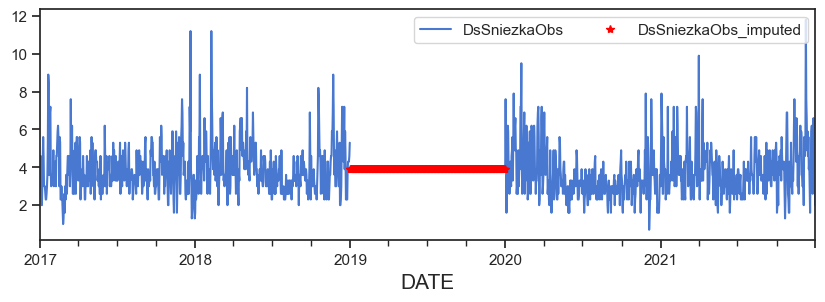

In [24]:
#Initial imputation using linear interpolation
no2_stations['DsSniezkaObs_first_impute']=\
no2_stations['DsSniezkaObs'].bfill()

ax=no2_stations['DsSniezkaObs'].plot(figsize=(10, 3))

no2_stations.loc[no2_stations['DsSniezkaObs'].isna(), 'DsSniezkaObs_first_impute'].\
    plot(linestyle='', marker='*', c='red', ax=ax, label='DsSniezkaObs_imputed');

ax.legend(ncol=2, loc='upper right');

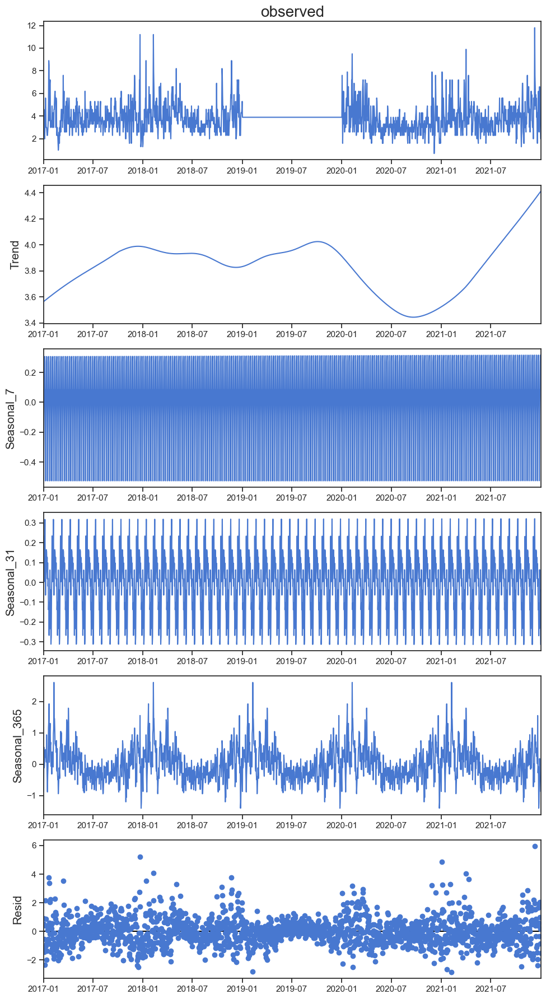

In [25]:
#Decomposing to trend, seasonal and residual components using MSTL
from statsmodels.tsa.seasonal import MSTL

mstl = MSTL(no2_stations['DsSniezkaObs_first_impute'], 
            periods=(7, 31, 365), #Weekly, monthly, and yearly seasonality
            windows=[1001, 501, 101],
            stl_kwargs={
                "seasonal_deg":0, # Means the seasonal smoother is fit with a moving average.
               }
           )

res=mstl.fit()

fig = res.plot()
fig.set_size_inches((10, 18))
fig.tight_layout()

In [26]:
#Filter only those rows that contains missing values
#Then for those rows in DsSniezkaObs that contains null values, take the corresponding rows from both 
#extracted seasonal and trend components and add them and finally subtract residuals

no2_stations['DsSniezkaObs_impute_final'] = no2_stations['DsSniezkaObs']

null_values = no2_stations['DsSniezkaObs'].isna()

no2_stations['DsSniezkaObs_impute_final'].loc[null_values] = \
res.seasonal.loc[null_values].sum(axis=1) + res.trend.loc[null_values] - res.resid.loc[null_values]

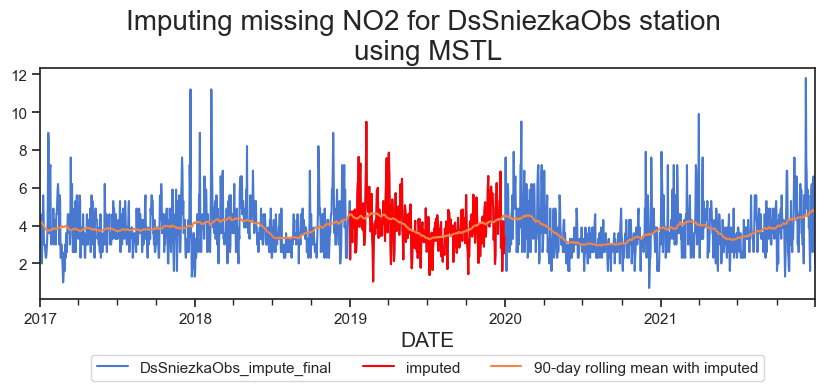

In [27]:
ax = no2_stations['DsSniezkaObs_impute_final'].plot()

no2_stations.loc[null_values, 'DsSniezkaObs_impute_final'].\
    plot(c='red', ax=ax, label='imputed', figsize=(10, 3))

no2_stations['DsSniezkaObs_impute_final'].rolling(90, center=True, min_periods=30).mean().\
    plot(ax=ax, label='90-day rolling mean with imputed')

ax.legend(ncol=3, loc='center', bbox_to_anchor=(0.5, -0.3))
ax.set_title("Imputing missing NO2 for DsSniezkaObs station \nusing MSTL");

Using MSTL to impute the missing values seems to be appropriate here as the overal pattern for each year remains similar.

In [28]:
no2_stations['DsSniezkaObs'] = no2_stations['DsSniezkaObs_impute_final']

In [29]:
no2_stations = no2_stations.drop(['DsSniezkaObs_first_impute', 'DsSniezkaObs_impute_final'], axis=1)

In [30]:
no2_stations.isna().sum()

POLSTID
DsSniezkaObs    0
LbJarczWolaM    0
PmLebaRabkaE    0
dtype: int64

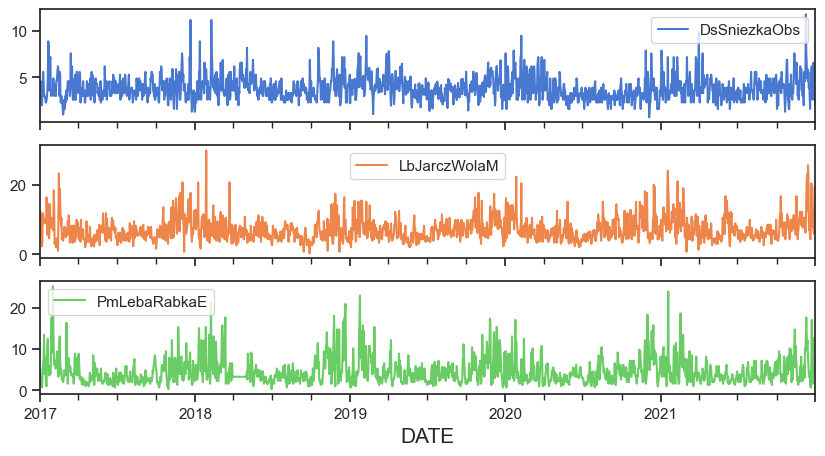

In [31]:
no2_stations.plot(subplots=True, figsize=(10, 5));

# Creating station name prefix

From the time series plots, some stations seems to stop measuring while another station starts measuring the same where the previous station left, as shown in the plot below.

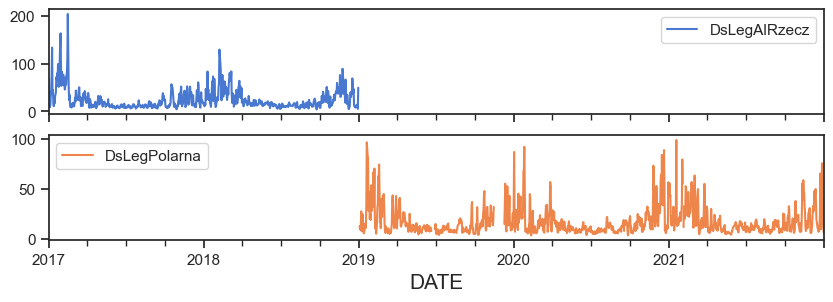

In [32]:
#Example
df.loc[df['POLSTID'].str.contains(r'^DsLeg')].set_index(['DATE', 'POLSTID'])['PM25_24H_AVG_POLLUTION'].\
    unstack('POLSTID').plot(subplots=True, figsize=(10, 3));

The station names starts in a similar pattern where the first 2 letters denotes the voivodship and the next 3 or more letters (until before the next capital letter) represents the powiat/city.

In [33]:
df.loc[
    df['POLSTID'].str.contains(r'^DsLeg'), 
    ['POLSTID', 'Voivodeship', 'City', 'county', 'LAT', 'LON']
].drop_duplicates()

,POLSTID,Voivodeship,City,county,LAT,LON
10,DsLegAlRzecz,DOLNOŚLĄSKIE,Legnica,powiat Legnica,51.204503,16.180513
11,DsLegPolarna,DOLNOŚLĄSKIE,Legnica,powiat Legnica,51.208104,16.183784


As seen in the table above, both these stations are from the same location. Even the coordinates are close.

Therefore, it was agreed to combine those stations that are next to each other and shows measurements in the pattern similar to the earlier plot above. In the net section, I will extract a part of the station name inorder to identify stations next to each other

In [34]:
#Extracting the abbreviations from station names using Regex

#These stations needs to be treated differently.
exception_stations = ['LbBiaSlupRPN', 'LbBiaPodOrze', 'MpNoSaczNadb', 'MpNoTargPSlo']

df.loc[df['POLSTID'].isin(exception_stations), 'station_abbrev'] = \
df.loc[df['POLSTID'].isin(exception_stations), 'POLSTID'].\
    str.extract(r'(^[A-Z][a-z][A-Z]+[a-z]+[A-Z][a-z]+)[A-Z].*$', expand=False)

df.loc[~df['POLSTID'].isin(exception_stations), 'station_abbrev'] = \
df.loc[~df['POLSTID'].isin(exception_stations), 'POLSTID'].\
    str.extract(r'(^[A-Z][a-z][A-Z]+[a-z]+)\d*[A-Z]*.*$', expand=False)

In [35]:
#Creating a df with a list of the abbreviation and corresponding stations
station_groups=\
df[['station_abbrev', 'POLSTID', 'Voivodeship', 'City', 'county', 'LAT', 'LON']].\
    drop_duplicates().sort_values(['station_abbrev', 'POLSTID'])

station_groups.head(10)

,station_abbrev,POLSTID,Voivodeship,City,county,LAT,LON
0,DsBolesla,DsBoleslaMOB,DOLNOŚLĄSKIE,Bolesławiec,powiat bolesławiecki,51.263245,15.570354
1,DsCzer,DsCzerStraza,DOLNOŚLĄSKIE,Czerniawa,powiat lubański,50.912475,15.312190
2,DsGlog,DsGlogWiStwo,DOLNOŚLĄSKIE,Głogów,powiat głogowski,51.657022,16.097822
3,DsJawor,DsJaworMOB,DOLNOŚLĄSKIE,Jawor,powiat jaworski,51.049212,16.202317
4,DsJel,DsJelGorOgin,DOLNOŚLĄSKIE,Jelenia Góra,powiat Jelenia Góra,50.913433,15.765608
5,DsJel,DsJelGorSoko,DOLNOŚLĄSKIE,Jelenia Góra,powiat Jelenia Góra,50.871214,15.700947
6,DsKam,DsKamGoraMOB,DOLNOŚLĄSKIE,Kamienna Góra,powiat kamiennogórski,50.788079,16.035122
7,DsKlodz,DsKlodzSzkol,DOLNOŚLĄSKIE,Kłodzko,powiat kłodzki,50.433493,16.653660
8,DsKudowa,DsKudowaMOB,DOLNOŚLĄSKIE,Kudowa-Zdrój,powiat kłodzki,50.447096,16.238509
9,DsLadek,DsLadekMOB,DOLNOŚLĄSKIE,Lądek-Zdrój,powiat kłodzki,50.341864,16.889899


In [36]:
#Creating list of abbreviations with multiple stations
#Taking count of stations per abbreviation and saving to a column
station_groups['stn_abbrv_count'] = station_groups.groupby(['station_abbrev']).transform('size')

The above dataframe can help with finding those stations close to each other in order to impute missing values using measurements from the other station next to each other.

# O3 Stations

In [38]:
#Filtering those stations that do not contain O3 measurements
#Then creating a seperate dataframe for O3 measurements and where each station is a column
o3_stations=\
df.loc[~df['POLSTID'].isin(non_o3_stations)].\
    groupby(['POLSTID', 'DATE'])['O3_24H_AVG_POLLUTION'].mean().\
        unstack('POLSTID')

#Setting daily frequncy as daily
o3_stations.index.freq='D'

o3_stations.head()

POLSTID,DsBoleslaMOB,DsCzerStraza,DsJelGorOgin,DsKlodzSzkol,DsKudowaMOB,DsLadekMOB,DsLegAlRzecz,DsLubanMOB,DsLubanMieszMOB,DsOlawZolnAK,...,WmOstrPilsud,WmPuszczaBor,WpBoroDrapal,WpKaliSawick,WpKoniWyszyn,WpPiaskiKrzy,WpPoznDabrow,ZpKoszChopin,ZpSzczAndr01,ZpWiduBulRyb
DATE,,,,,,,,,,,,,,,,,,,,,
2017-01-01,NaN,90.39,11.98,15.24,NaN,NaN,20.63,NaN,NaN,NaN,...,NaN,31.47,34.56,39.08,43.55,NaN,31.05,NaN,40.48,40.23
2017-01-02,NaN,46.19,19.04,6.71,NaN,NaN,18.14,NaN,NaN,NaN,...,NaN,52.38,24.87,28.02,27.66,NaN,22.17,NaN,36.73,43.31
2017-01-03,NaN,59.58,46.34,28.45,NaN,NaN,42.42,NaN,NaN,NaN,...,NaN,57.43,41.12,46.56,44.86,NaN,36.90,NaN,45.63,44.53
2017-01-04,NaN,68.96,51.37,51.49,NaN,NaN,53.37,NaN,NaN,NaN,...,NaN,58.41,56.47,61.87,62.32,NaN,53.36,NaN,58.73,64.38
2017-01-05,NaN,69.62,59.68,65.63,NaN,NaN,55.18,NaN,NaN,NaN,...,NaN,63.12,65.00,66.41,65.54,75.49,69.30,NaN,60.34,69.73


In [39]:
#Sorting columns by station name in order to compare when observing time series plots
o3_stations = o3_stations[np.sort(o3_stations.columns)]

In [40]:
#Grouping by O3 stations and checking count of null values.
o3_stn_null_cnt = o3_stations.isnull().sum()
o3_stn_null_cnt

POLSTID
DsBoleslaMOB    1471
DsCzerStraza     737
DsJelGorOgin       0
DsKlodzSzkol      30
DsKudowaMOB     1473
                ... 
WpPiaskiKrzy       7
WpPoznDabrow       3
ZpKoszChopin     736
ZpSzczAndr01      26
ZpWiduBulRyb       4
Length: 125, dtype: int64

In [41]:
print(f"Number of O3 Stations to impute: {len(o3_stn_null_cnt[o3_stn_null_cnt!=0])}")

Number of O3 Stations to impute: 121


In [42]:
#Saving those stations with no null values. Maybe useful to create a column indicating whether this column
#was imputed or not.
no_null_o3_stns=o3_stn_null_cnt[o3_stn_null_cnt==0].index

In [43]:
#Saving those O3 stations with count of null values higher and equal to 364 
#(more than a year of missing values)
o3_high_incomplete = o3_stn_null_cnt[o3_stn_null_cnt>=364].sort_index().index

#Saving those O3 stations with count of null values between 101 and 363
o3_mid_incomplete = o3_stn_null_cnt[o3_stn_null_cnt.between(101, 363)].index

#Saving those O3 stations with count of null values between 1 and 100
o3_low_incomplete = o3_stn_null_cnt[o3_stn_null_cnt.between(1, 100)].index

In [44]:
#Imputing O3 stations with less than 30 null values using simple linear interpolation

o3_stations[o3_low_incomplete]=\
o3_stations[o3_low_incomplete].interpolate('linear', limit_direction='both')

In [45]:
#Creating a function that imputes a column using MSTL
def impute_with_MSTL(df, col, interpolate_type='linear', use_resid=True):
    """Function to decompse the time series and then impute the missing values of the column"""
    
    null_values = df[col].isna()
    
    #First imputation using linear interpolation
    temp_df = df[col].interpolate(interpolate_type, limit_direction='both')
    
    #Creating MSTL
    mstl = MSTL(temp_df, 
            periods=(7, 31, 365), #Weekly, monthly, and yearly seasonality
            windows=[1001, 501, 101],
            stl_kwargs={
                "seasonal_deg":0, # Means the seasonal smoother is fit with a moving average.
               }
           )

    res=mstl.fit()
    
    #imputting missing values
    if use_resid:
        temp_df.loc[null_values] = \
        res.seasonal.loc[null_values].sum(axis=1) + res.trend.loc[null_values] - res.resid.loc[null_values]
    else:
        temp_df.loc[null_values] = \
        res.seasonal.loc[null_values].sum(axis=1) + res.trend.loc[null_values]
    
    #Plot the results
    imputation_plot(temp_df=temp_df, null_values=null_values, col=col)
    
    return temp_df

#Creating a function to plot the imputation results
def imputation_plot(temp_df, null_values, col):
    """Function to plot the time series and the imputed data with 90day rolling mean."""
    
    ax = temp_df.plot(figsize=(10, 3))
    
    temp_df.loc[null_values].plot(linestyle='', marker='*', c='red', ax=ax, label='imputed')
    temp_df.rolling(90, center=True, min_periods=30).mean().plot(ax=ax, label='90day Rolling Mean')

    ax.legend(ncol=3, loc='upper right')
    ax.set_title(f"Imputing {col} using MSTL");
    plt.show();

  0%|          | 0/3 [00:00<?, ?it/s]

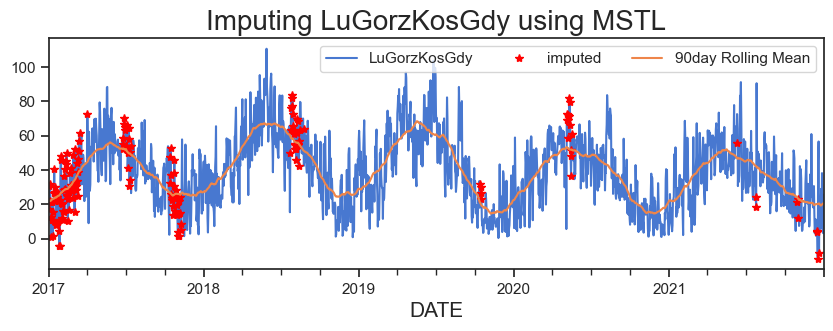

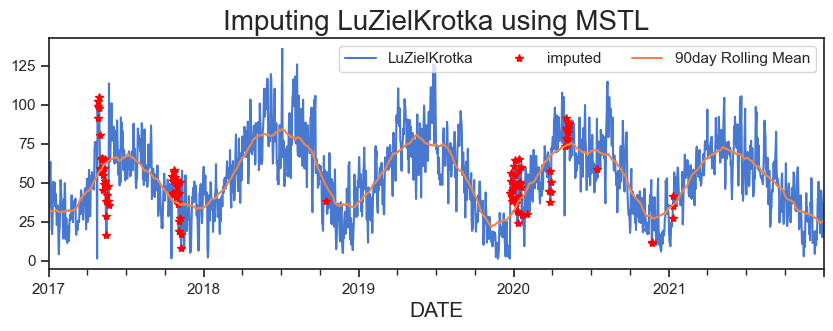

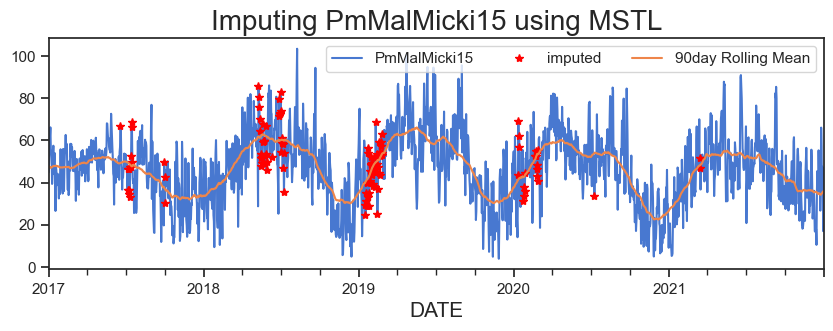

Wall time: 9.67 s


In [46]:
%%time
#Imputing stations between 15 and 363 null values using MSTL
for col in tqdm(o3_mid_incomplete):
    o3_stations[col] = impute_with_MSTL(df=o3_stations, col=col)

## Combining similar stations

In [47]:
#Filtering those abbrevations that has multiple stations and those stations that are in 
#o3_high_incomplete variable.
#Among the filtered stations, we are only filtering those stations that are close to each other 
#to combine the measurements.
#Finally, save the result as a dictinary where each abbreviation is the key and the correspnding stations
#is saved as a list.

nearby_O3_stns_high_nulls_dict=\
station_groups.loc[
    station_groups['stn_abbrv_count'].gt(1) & 
    station_groups['POLSTID'].isin(o3_high_incomplete)
].groupby('station_abbrev').filter(lambda x: len(x) > 1)[['station_abbrev', 'POLSTID']].\
    groupby('station_abbrev')['POLSTID'].apply(list).to_dict()

nearby_O3_stns_high_nulls_dict

{'DsLuban': ['DsLubanMOB', 'DsLubanMieszMOB'],
 'KpWlocl': ['KpWloclChelmMOB', 'KpWloclKalis'],
 'MzWar': ['MzWarChrosci', 'MzWarMeteo', 'MzWarPodlesn'],
 'PdBial': ['PdBialPulPie', 'PdBialWarsza'],
 'SkKiel': ['SkKielJagiel', 'SkKielTargow'],
 'SlDabro': ['SlDabro1000L', 'SlDabroTysia']}

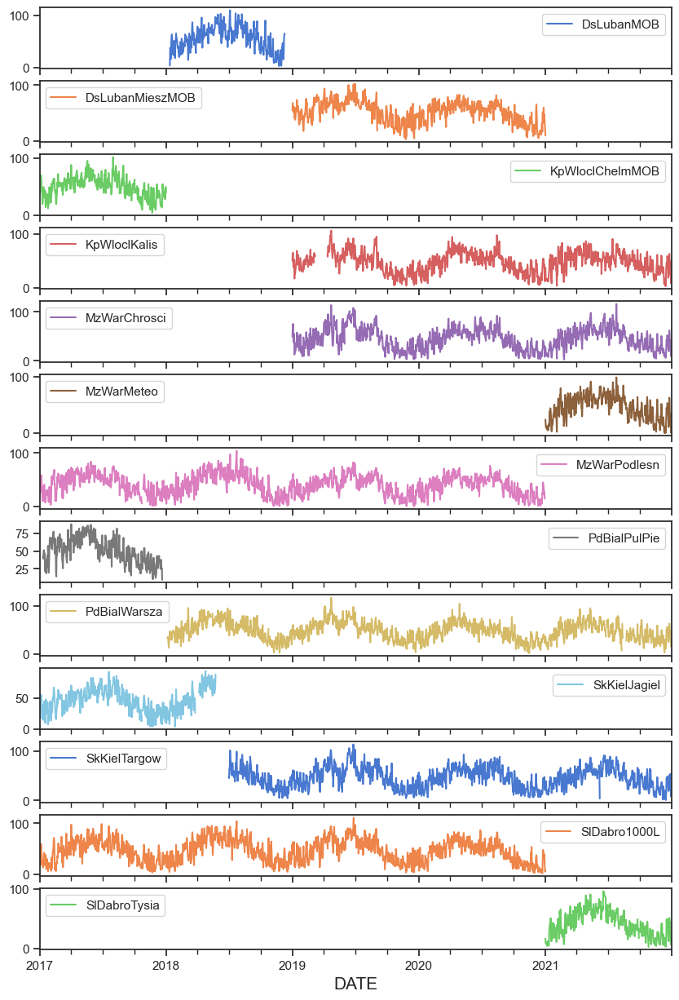

In [48]:
o3_stations[[
    val for sublist in nearby_O3_stns_high_nulls_dict.values() for val in sublist
]].plot(subplots=True, figsize=(10, 15));

In [49]:
def impute_by_combining(df, val):
    
    #Saving this subset of data to a temp df
    temp_df = df[val]
    #Creating year column
    temp_df['year'] = temp_df.index.year
    
    #Creating a dictionary that saves the column name as key and the latest year that 
    #contains non null values
    temp_dict = {}
    for col in temp_df.columns[:-1]:
        #Groupby year and count non null values
        grouped = temp_df.groupby(['year']).apply(lambda x: x[col].notnull().sum())
        
        #Take the max year with non null values
        temp_dict[col] = grouped[grouped>10].index.max()
    
    #Sort the dictionary by the year
    temp_dict_sorted = dict(sorted(temp_dict.items(), key=lambda x:x[1], reverse=True))
    #convert the sorted keys that contains the column names as a list so that indexing can be done
    temp_list = list(temp_dict_sorted.keys())
    
    #The last item in the list contains the station that closed before 2021, so we will use it to 
    #impute the missing values of all other stations in the list.
    for i in range(len(temp_list))[:-1]:
        temp_df.loc[temp_df[temp_list[i]].isnull() & temp_df[temp_list[-1]].notnull(), temp_list[i]] = \
        temp_df.loc[temp_df[temp_list[i]].isnull() & temp_df[temp_list[-1]].notnull(), temp_list[-1]]
        
    return temp_df.drop('year', axis=1)

In [50]:
for val in tqdm(nearby_O3_stns_high_nulls_dict.values()):
    o3_stations[val] = impute_by_combining(df=o3_stations, val=val)

  0%|          | 0/6 [00:00<?, ?it/s]

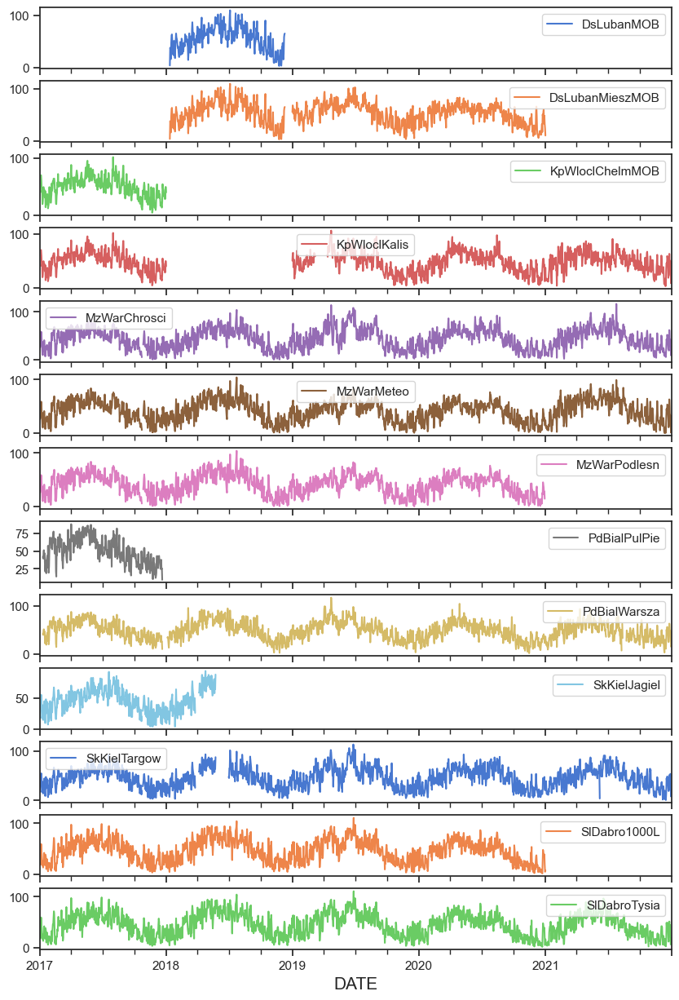

In [51]:
o3_stations[[
    val for sublist in nearby_O3_stns_high_nulls_dict.values() for val in sublist
]].plot(subplots=True, figsize=(10, 15));

In [52]:
grouped_combined_stns=\
o3_stations[[
    val for sublist in nearby_O3_stns_high_nulls_dict.values() for val in sublist
]].groupby(o3_stations.index.year).apply(lambda x: x.notnull().sum()).T

#These combined stations have latest measurements, so only these will be imputed with MSTL
combined_o3_stns_to_impute = grouped_combined_stns[grouped_combined_stns[2021]>1].index
combined_o3_stns_to_impute

Index(['KpWloclKalis', 'MzWarChrosci', 'MzWarMeteo', 'PdBialWarsza',
       'SkKielTargow', 'SlDabroTysia'],
      dtype='object', name='POLSTID')

In [53]:
o3_stations[combined_o3_stns_to_impute].isnull().sum()

POLSTID
KpWloclKalis    402
MzWarChrosci      5
MzWarMeteo        8
PdBialWarsza     44
SkKielTargow     51
SlDabroTysia      8
dtype: int64

  0%|          | 0/6 [00:00<?, ?it/s]

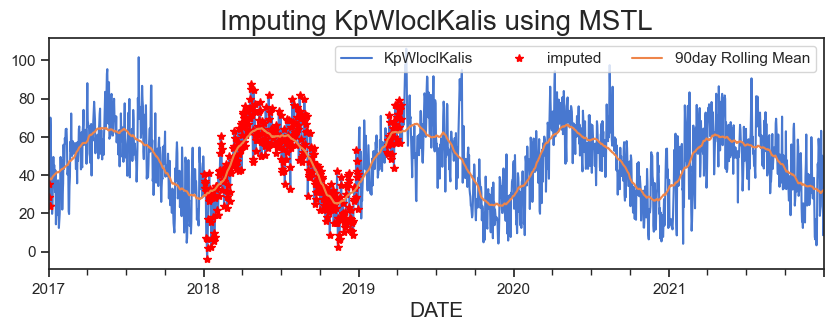

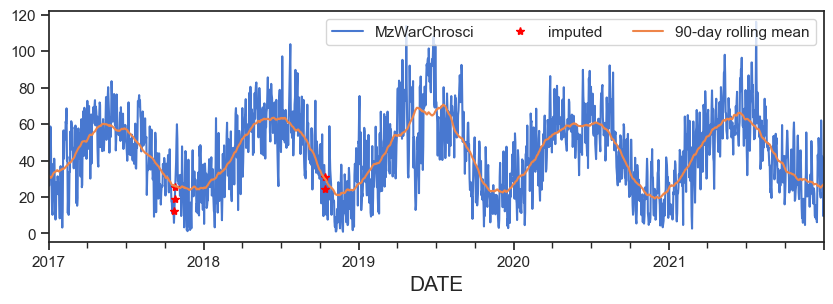

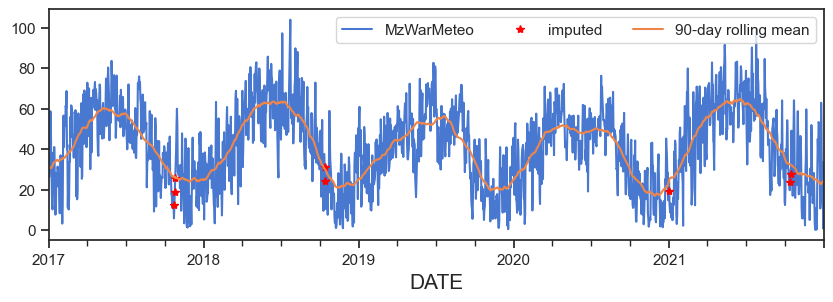

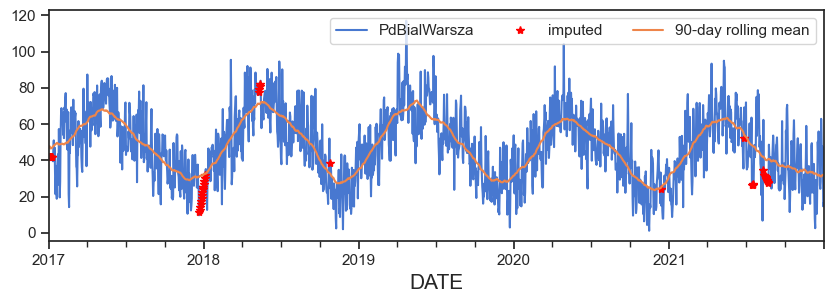

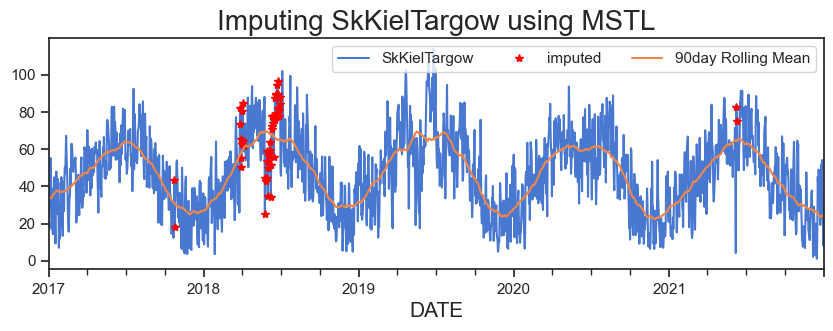

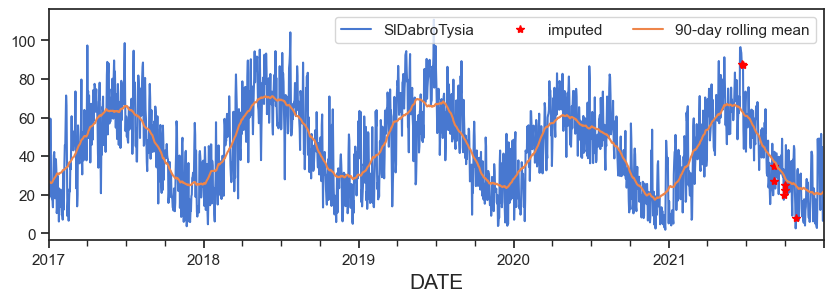

Wall time: 7.3 s


In [54]:
%%time
#Imputing combined stations
for col in tqdm(combined_o3_stns_to_impute):
    
    #Impute using interpolation for those stations with less than 50 null values
    if o3_stations[col].isnull().sum() < 50:
        
        null_values=o3_stations[col].isnull()
        o3_stations[col] = o3_stations[col].interpolate('linear', limit_direction='both')
        
        plot_simple_impute(df=o3_stations, col=col, null_val=null_values)
        
    else:
        #Impute those stations with high null values with MSTL
        o3_stations[col] = impute_with_MSTL(df=o3_stations, col=col)

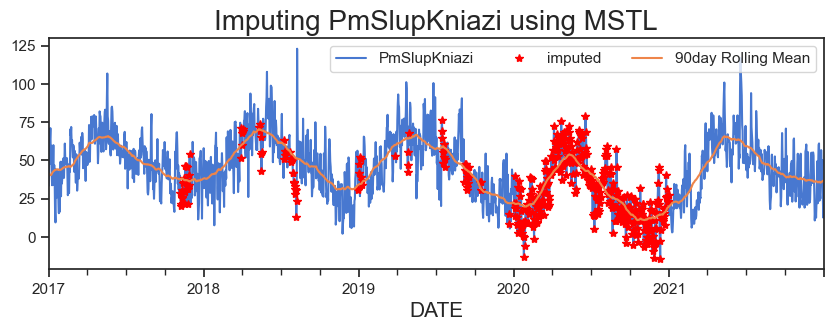

In [55]:
#1 more stations that are not among the combined stations but has missing value for a year in the middle.
o3_stations['PmSlupKniazi'] = impute_with_MSTL(df=o3_stations, col='PmSlupKniazi')

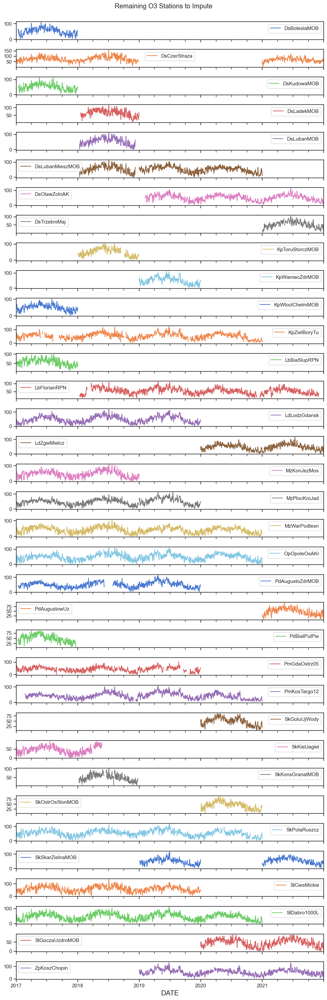

In [56]:
#Saving the remaining stations with large gaps 
remaining_O3_stns_to_impute = \
o3_stations.isnull().sum()[o3_stations.isnull().sum()!=0].index

o3_stations[remaining_O3_stns_to_impute].plot(subplots=True, figsize=(10, 30));
plt.suptitle("Remaining O3 Stations to Impute",  y=1)
plt.tight_layout();

In [57]:
print(f"Remining O3 Stations to impute: {len(remaining_O3_stns_to_impute)}")

Remining O3 Stations to impute: 35


#### We have reduced the number of O3 stations to impute from 121 to 35.

# PM10 Stations

In [58]:
#Filtering those stations that do not contain pm10 measurements
#Then creating a seperate dataframe for pm10 measurements and where each station is a column
pm10_stations=\
df.loc[~df['POLSTID'].isin(non_pm10_stations)].\
    groupby(['POLSTID', 'DATE'])['PM10_24H_AVG_POLLUTION'].mean().\
        unstack('POLSTID')

#Setting daily frequncy as daily
pm10_stations.index.freq='D'

#Sorting columns by station name in order to compare when observing time series plots
pm10_stations = pm10_stations[np.sort(pm10_stations.columns)]

pm10_stations.head()

POLSTID,DsGlogWiStwo,DsJaworMOB,DsJelGorSoko,DsKamGoraMOB,DsLegAlRzecz,DsMiliczMOB,DsNowRudJezi,DsNowRudSreb,DsOlawZolnAK,DsOlesBrzozo,...,ZpKoszChopin,ZpKoszSpasow,ZpMyslZaBram,ZpPolczSolanMOB,ZpSzczAndr01,ZpSzczBudzWosMOB,ZpSzczPils02,ZpSzczec1Maj,ZpSzczecPrze,ZpWiduBulRyb
DATE,,,,,,,,,,,,,,,,,,,,,
2017-01-01,30.68,NaN,NaN,NaN,77.28,NaN,NaN,272.66,45.43,88.48,...,NaN,30.30,32.47,NaN,28.61,NaN,33.70,28.92,27.19,34.29
2017-01-02,26.33,NaN,54.00,NaN,36.42,NaN,NaN,97.03,29.76,37.00,...,NaN,5.44,16.65,NaN,15.32,NaN,19.02,11.72,17.31,13.97
2017-01-03,12.75,NaN,24.12,NaN,15.95,NaN,NaN,52.43,14.18,15.81,...,NaN,10.89,7.34,NaN,7.68,NaN,12.87,12.01,10.53,6.90
2017-01-04,8.55,NaN,16.52,NaN,11.99,NaN,NaN,17.88,8.31,7.44,...,NaN,8.53,9.48,NaN,9.59,NaN,11.31,7.83,9.90,7.26
2017-01-05,10.81,NaN,20.16,NaN,22.91,NaN,NaN,15.92,11.04,6.70,...,NaN,5.62,11.09,NaN,6.51,NaN,9.47,9.78,17.04,19.78


In [59]:
#Grouping by pm10 stations and checking count of null values.
pm10_stn_null_cnt = pm10_stations.isnull().sum()

print(f"Number of PM10 Stations to impute: {len(pm10_stn_null_cnt[pm10_stn_null_cnt!=0])}")

Number of PM10 Stations to impute: 229


In [60]:
no_null_pm10_stns=pm10_stn_null_cnt[pm10_stn_null_cnt==0].index

In [61]:
#Saving those pm10 stations with count of null values higher and equal to 364 
#(more than a year of missing values)
pm10_high_incomplete = pm10_stn_null_cnt[pm10_stn_null_cnt>=364].sort_index().index

#Saving those pm10 stations with count of null values between 101 and 363
pm10_mid_incomplete = pm10_stn_null_cnt[pm10_stn_null_cnt.between(101, 363)].index

#Saving those pm10 stations with count of null values between 1 and 100
pm10_low_incomplete = pm10_stn_null_cnt[pm10_stn_null_cnt.between(1, 100)].index

In [62]:
#Imputing pm10 stations with less than 100 null values using simple linear interpolation

pm10_stations[pm10_low_incomplete]=\
pm10_stations[pm10_low_incomplete].interpolate('linear', limit_direction='both')

  0%|          | 0/16 [00:00<?, ?it/s]

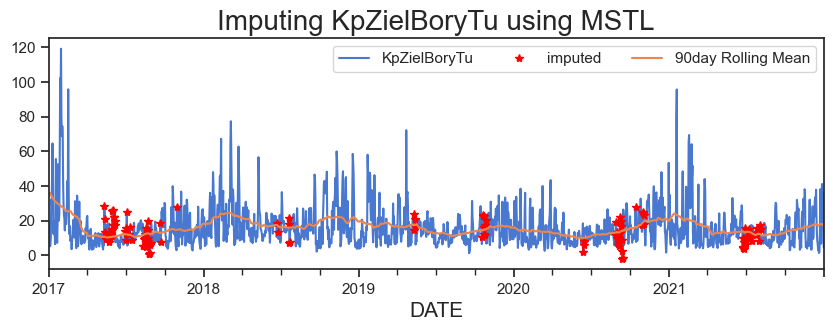

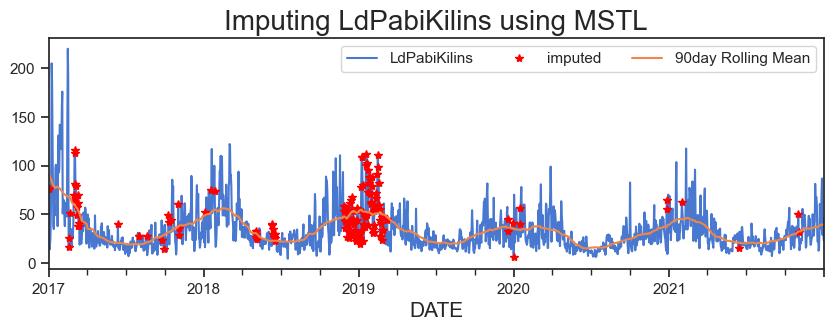

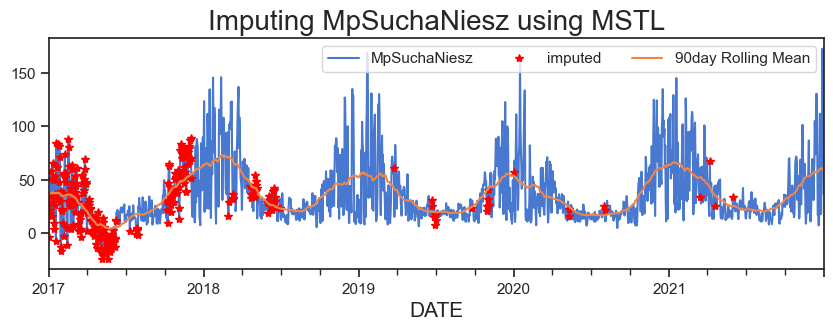

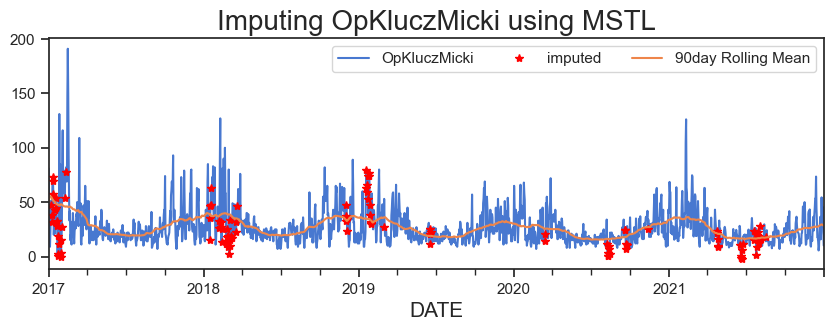

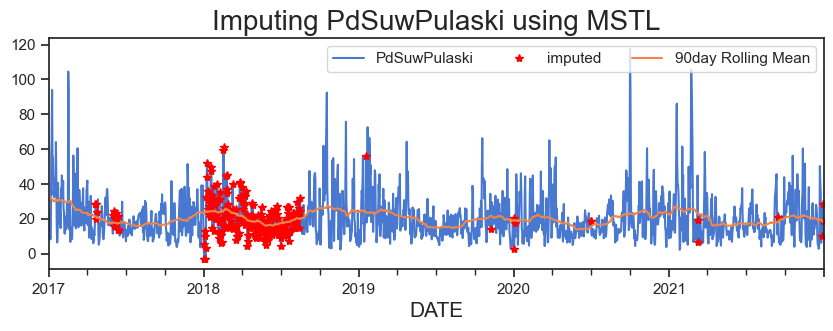

...

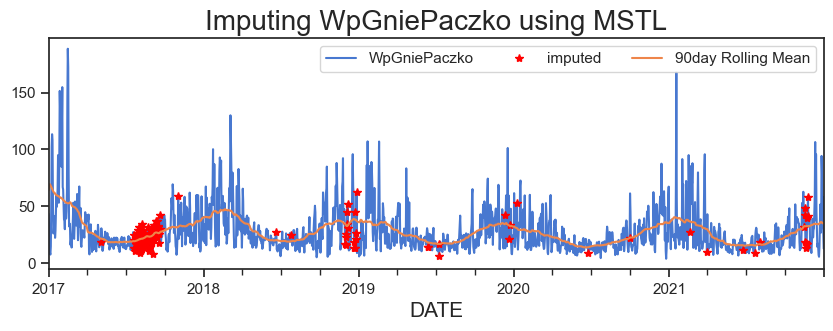

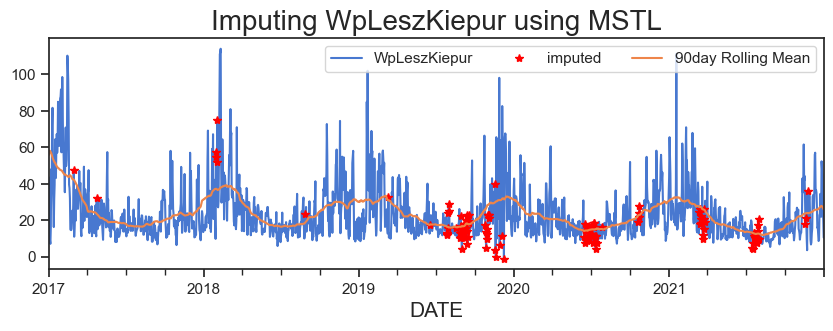

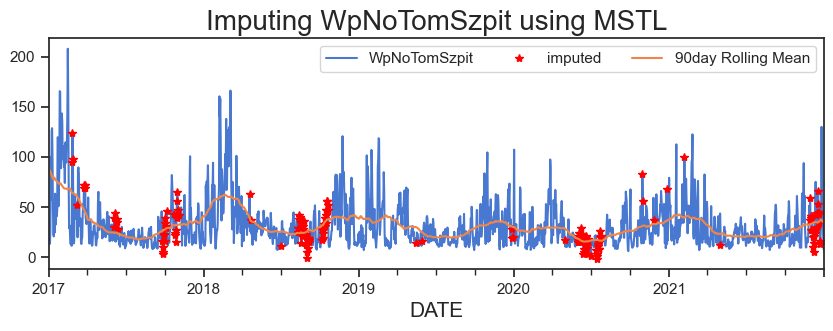

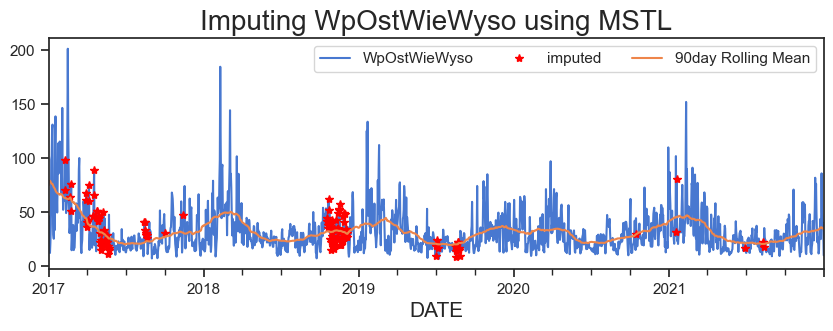

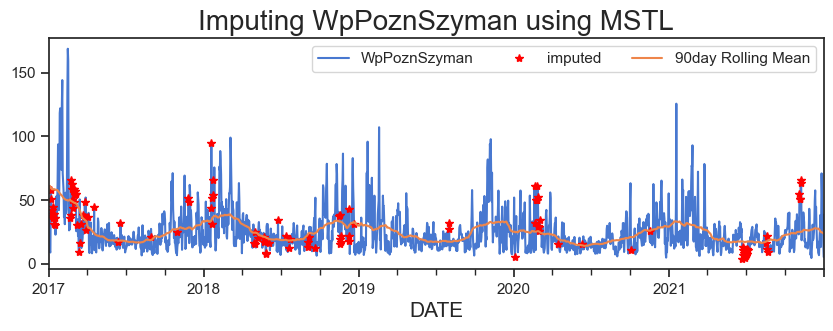

Wall time: 49.4 s


In [63]:
%%time
#Imputing stations between 100 and 363 null values using MSTL
for col in tqdm(pm10_mid_incomplete):
    pm10_stations[col] = impute_with_MSTL(df=pm10_stations, col=col)

In [64]:
#Filtering those abbrevations that has multiple stations and those stations that are in 
#pm10_high_incomplete variable.
#Among the filtered stations, we are only filtering those stations that are close to each other 
#to combine the measurements.
#Finally, save the result as a dictinary where each abbreviation is the key and the correspnding stations
#is saved as a list.

nearby_pm10_stns_high_nulls_dict=\
station_groups.loc[
    station_groups['stn_abbrv_count'].gt(1) & 
    station_groups['POLSTID'].isin(pm10_high_incomplete)
].groupby('station_abbrev').filter(lambda x: len(x) > 1)[['station_abbrev', 'POLSTID']].\
    groupby('station_abbrev')['POLSTID'].apply(list).to_dict()

nearby_pm10_stns_high_nulls_dict

{'DsNow': ['DsNowRudJezi', 'DsNowRudSreb'],
 'KpByd': ['KpBydPlPozna', 'KpBydWarszaw'],
 'KpNakl': ['KpNaklSkargi', 'KpNaklWawrzy'],
 'LbChel': ['LbChelJagiel', 'LbChelPolan'],
 'LdOpoc': ['LdOpocCurieSk', 'LdOpocSkCuri'],
 'LdUniej': ['LdUniejTermy', 'LdUniejZamko'],
 'MpKrak': ['MpKrakAlKras', 'MpKrakOsPias', 'MpKrakSwoszo', 'MpKrakTelime'],
 'MpMuszyn': ['MpMuszynKity', 'MpMuszynZloc'],
 'MzKon': ['MzKonJezMos', 'MzKonJezWieMOB'],
 'MzWar': ['MzWarAlNiepo', 'MzWarBajkowa', 'MzWarChrosci', 'MzWarTolstoj'],
 'SkKiel': ['SkKielJagiel', 'SkKielJurajs', 'SkKielTargow'],
 'SlDabro': ['SlDabro1000L', 'SlDabroTysia'],
 'WmGold': ['WmGoldJacwie', 'WmGoldUzdrowMOB'],
 'WpPozn': ['WpPoznChwial', 'WpPoznSpycha'],
 'ZpKol': ['ZpKolKasprowMOB', 'ZpKolZolkiew'],
 'ZpKosz': ['ZpKoszChopin', 'ZpKoszSpasow']}

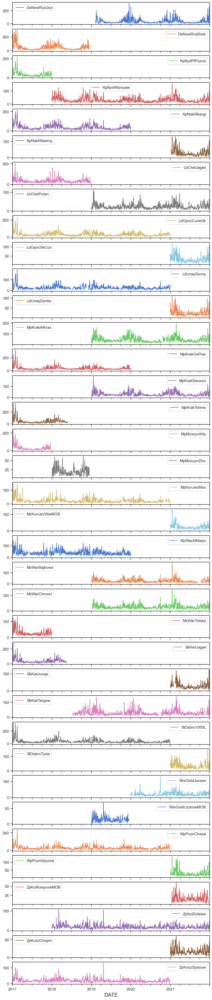

In [65]:
pm10_stations[[
    val for sublist in nearby_pm10_stns_high_nulls_dict.values() for val in sublist
]].plot(subplots=True, figsize=(10, 50));

  0%|          | 0/16 [00:00<?, ?it/s]

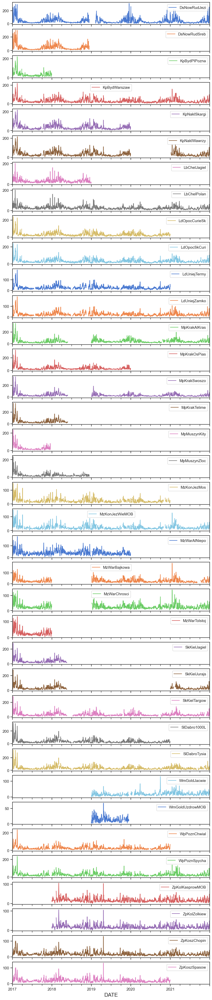

In [66]:
for val in tqdm(nearby_pm10_stns_high_nulls_dict.values()):
    pm10_stations[val] = impute_by_combining(df=pm10_stations, val=val)
    
pm10_stations[[
    val for sublist in nearby_pm10_stns_high_nulls_dict.values() for val in sublist
]].plot(subplots=True, figsize=(10, 50));

In [67]:
grouped_combined_stns=\
pm10_stations[[
    val for sublist in nearby_pm10_stns_high_nulls_dict.values() for val in sublist
]].groupby(pm10_stations.index.year).apply(lambda x: x.notnull().sum()).T

# #These combined stations have latest measurements and dont have a large gap of missing values, 
#so only these will be imputed with MSTL
combined_pm10_stns_to_impute = \
grouped_combined_stns[
    grouped_combined_stns[2021].ne(0) & 
    grouped_combined_stns[2017].ne(0) &
    grouped_combined_stns.sum(axis=1).gt(1000) &
    grouped_combined_stns.sum(axis=1).lt(1826) #One station has no null values (LbChelPolan)
].index

combined_pm10_stns_to_impute

Index(['DsNowRudJezi', 'KpBydWarszaw', 'KpNaklWawrzy', 'LdOpocSkCuri',
       'LdUniejZamko', 'MpKrakAlKras', 'MpKrakSwoszo', 'MzKonJezWieMOB',
       'MzWarBajkowa', 'MzWarChrosci', 'SkKielTargow', 'SlDabroTysia',
       'WpPoznSpycha', 'ZpKoszChopin'],
      dtype='object', name='POLSTID')

In [68]:
pm10_stations[combined_pm10_stns_to_impute].isnull().sum()

POLSTID
DsNowRudJezi       71
KpBydWarszaw        7
KpNaklWawrzy      393
LdOpocSkCuri       23
LdUniejZamko       80
MpKrakAlKras      256
MpKrakSwoszo      235
MzKonJezWieMOB    188
MzWarBajkowa      410
MzWarChrosci      385
SkKielTargow      124
SlDabroTysia       75
WpPoznSpycha       74
ZpKoszChopin        5
dtype: int64

  0%|          | 0/14 [00:00<?, ?it/s]

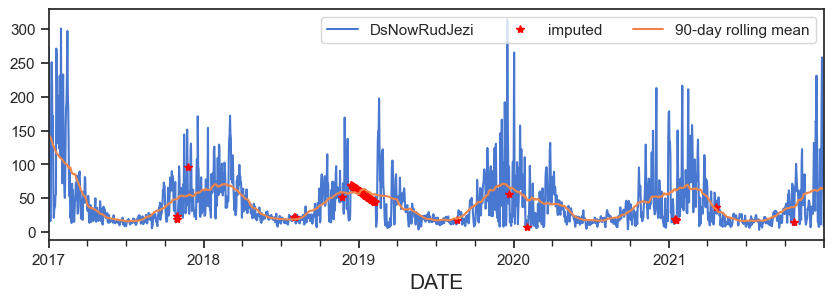

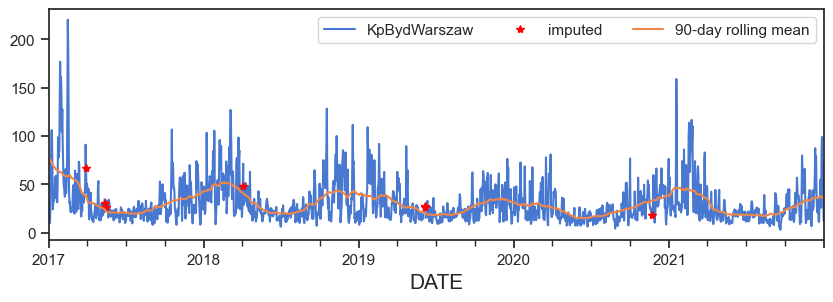

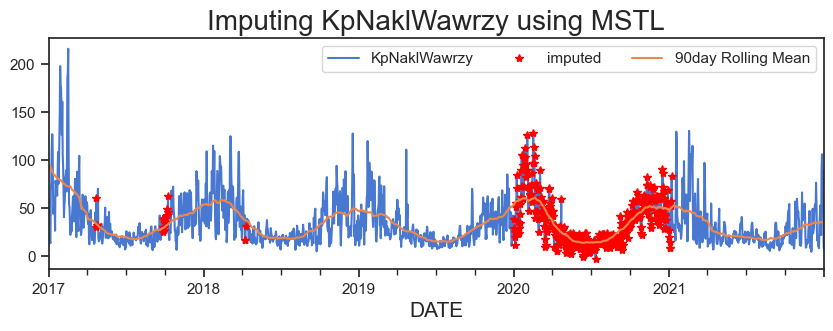

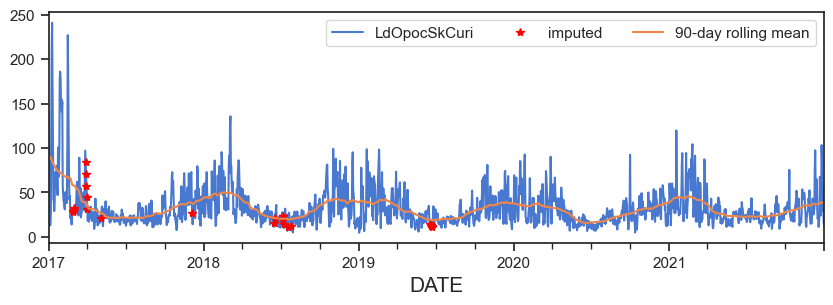

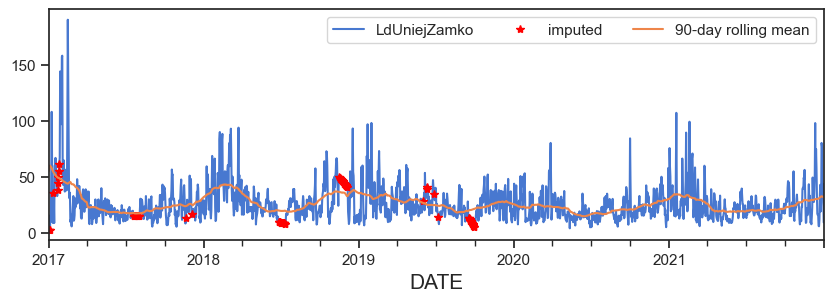

...

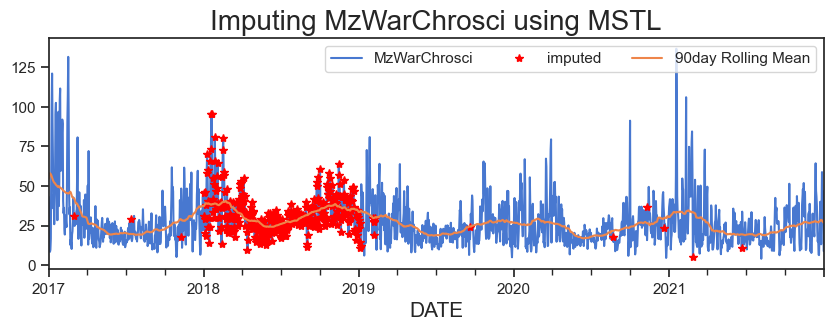

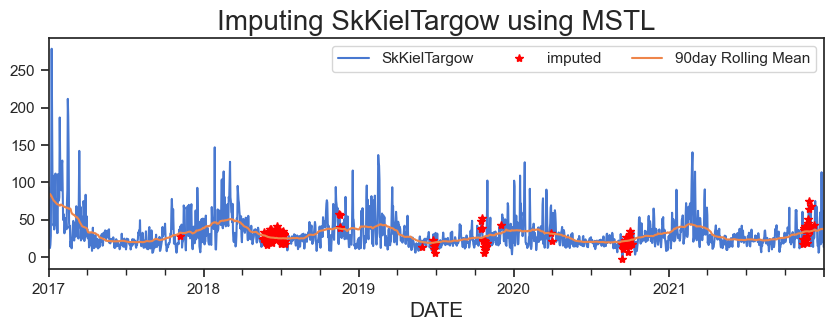

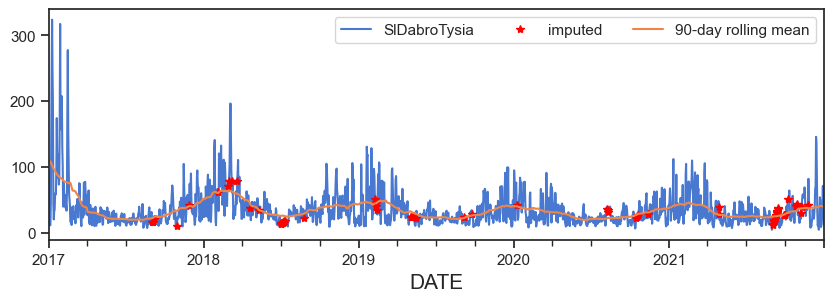

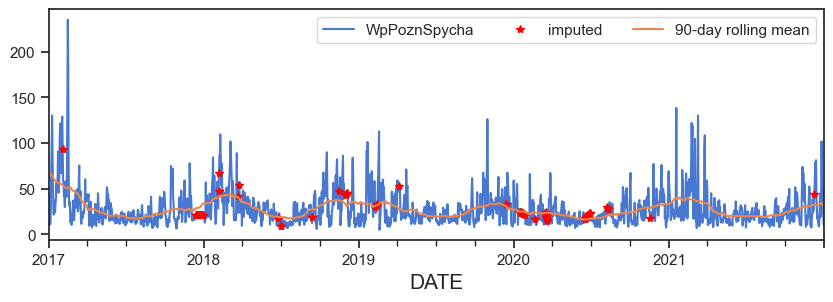

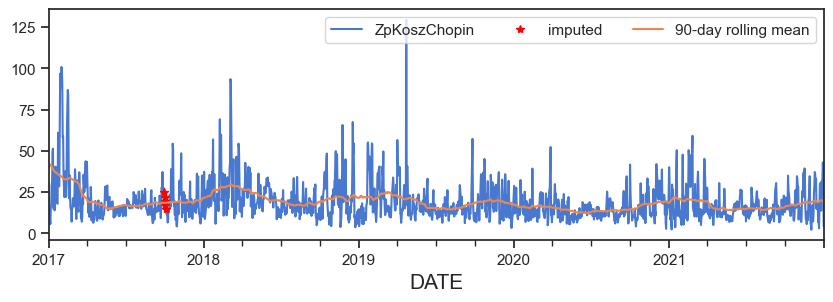

Wall time: 23.2 s


In [69]:
%%time
#Imputing combined stations
for col in tqdm(combined_pm10_stns_to_impute):
    
    #Impute using interpolation for those stations with less than 100 null values
    if pm10_stations[col].isnull().sum() < 100:
        
        null_values=pm10_stations[col].isnull()
        pm10_stations[col] = pm10_stations[col].interpolate('linear', limit_direction='both')
        
        plot_simple_impute(df=pm10_stations, col=col, null_val=null_values)
        
    else:
        #Impute those stations with high null values with MSTL
        pm10_stations[col] = impute_with_MSTL(df=pm10_stations, col=col)

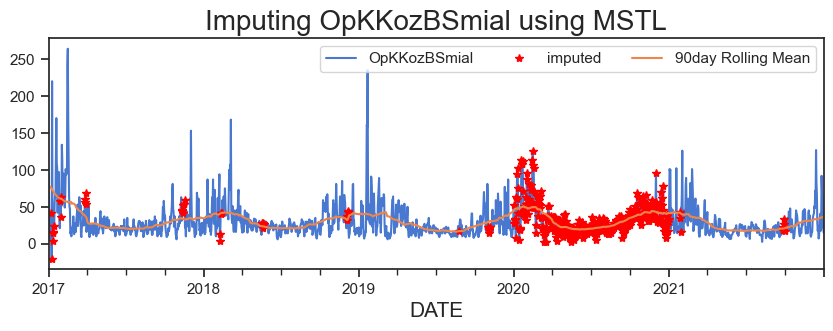

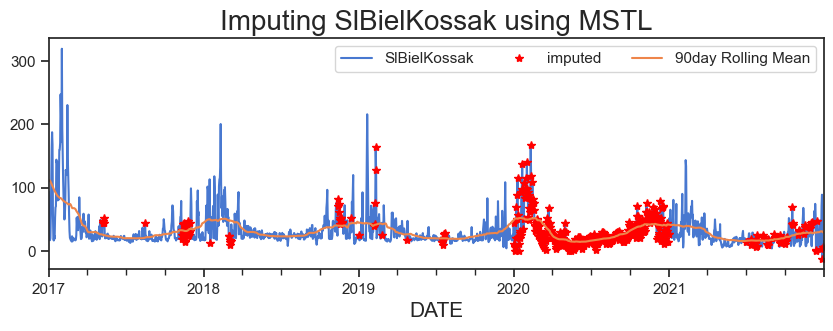

In [70]:
#Two more stations that are not among the combined stations but has missing value for a year in the middle.
for col in ['OpKKozBSmial', 'SlBielKossak']:
    pm10_stations[col] = impute_with_MSTL(df=pm10_stations, col=col)

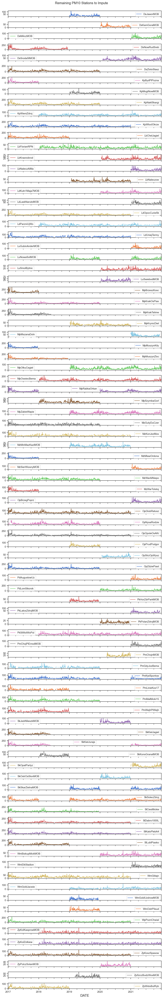

In [71]:
#Saving the remaining stations with large gaps and missing values either for entire 2017 or 2021
remaining_pm10_stns_to_impute = \
pm10_stations.isnull().sum()[pm10_stations.isnull().sum()!=0].index

pm10_stations[remaining_pm10_stns_to_impute].plot(subplots=True, figsize=(10, 60));
plt.suptitle("Remaining PM10 Stations to Impute",  y=1)
plt.tight_layout();

In [72]:
print(f"Remining PM10 Stations to impute: {len(remaining_pm10_stns_to_impute)}")

Remining PM10 Stations to impute: 89


#### Remaining PM10 station to impute has been reduced from 229 to 89.

# PM2.5 Stations

In [73]:
#Filtering those stations that do not contain pm25 measurements
#Then creating a seperate dataframe for pm25 measurements and where each station is a column
pm25_stations=\
df.loc[~df['POLSTID'].isin(non_pm25_stations)].\
    groupby(['POLSTID', 'DATE'])['PM25_24H_AVG_POLLUTION'].mean().\
        unstack('POLSTID')

#Setting daily frequncy as daily
pm25_stations.index.freq='D'

#Sorting columns by station name in order to compare when observing time series plots
pm25_stations = pm25_stations[np.sort(pm25_stations.columns)]

pm25_stations.head()

POLSTID,DsLegAlRzecz,DsLegPolarna,DsOsieczow21,DsWalbrzWyso,DsWrocNaGrob,DsZgorBohGet,KpBydBerling,KpBydFieldor,KpChelmLunawMOB,KpGrudSienki,...,WmOstrPilsud,WmPuszczaBor,WpKaliSawick,WpPleszAlMic,WpPoznDabrow,WpPoznPolank,ZpKoszSpasow,ZpMyslZaBram,ZpSzczAndr01,ZpSzczec1Maj
DATE,,,,,,,,,,,,,,,,,,,,,
2017-01-01,66.51,NaN,28.94,48.74,53.57,43.50,18.187208,NaN,NaN,31.381341,...,NaN,19.84,37.49,37.9,NaN,36.13,21.99,29.03,20.10,20.28
2017-01-02,32.24,NaN,18.36,33.46,31.33,30.44,15.202847,NaN,NaN,24.272445,...,NaN,8.01,29.59,40.7,NaN,25.72,3.21,13.06,9.13,5.58
2017-01-03,13.65,NaN,6.46,NaN,12.69,11.04,10.386086,NaN,NaN,17.517686,...,NaN,9.44,9.86,21.9,NaN,14.73,6.09,5.44,3.89,5.91
2017-01-04,8.91,NaN,4.10,NaN,6.13,9.36,4.601749,NaN,NaN,8.476422,...,NaN,5.24,3.20,14.4,NaN,6.09,3.72,5.81,3.04,2.53
2017-01-05,15.51,NaN,5.89,NaN,8.28,10.25,9.385009,NaN,NaN,19.621815,...,NaN,5.21,9.82,39.6,NaN,8.18,3.05,9.62,2.70,4.39


In [74]:
#Grouping by pm25 stations and checking count of null values.
pm25_stn_null_cnt = pm25_stations.isnull().sum()

print(f"Number of PM25 Stations to impute: {len(pm25_stn_null_cnt[pm25_stn_null_cnt!=0])}")

Number of PM25 Stations to impute: 79


In [75]:
no_null_pm25_stns = pm25_stn_null_cnt[pm25_stn_null_cnt==0].index

In [76]:
#Saving those pm25 stations with count of null values higher and equal to 364 
#(more than a year of missing values)
pm25_high_incomplete = pm25_stn_null_cnt[pm25_stn_null_cnt>=364].sort_index().index

#Saving those pm25 stations with count of null values between 101 and 363
pm25_mid_incomplete = pm25_stn_null_cnt[pm25_stn_null_cnt.between(101, 363)].index

#Saving those pm25 stations with count of null values between 1 and 100
pm25_low_incomplete = pm25_stn_null_cnt[pm25_stn_null_cnt.between(1, 100)].index

In [77]:
#Imputing pm25 stations with less than 100 null values using simple linear interpolation
pm25_stations[pm25_low_incomplete]=\
pm25_stations[pm25_low_incomplete].interpolate('linear', limit_direction='both')

  0%|          | 0/2 [00:00<?, ?it/s]

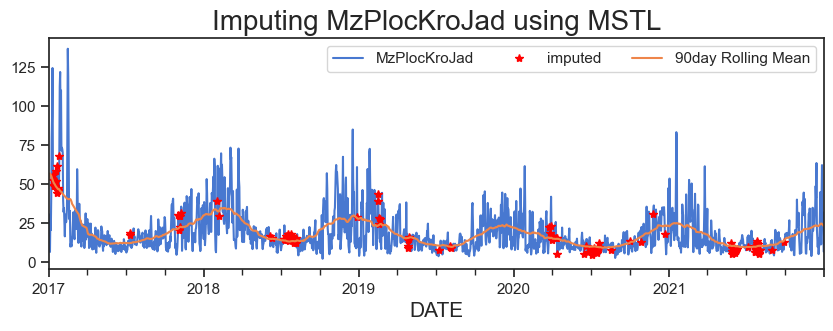

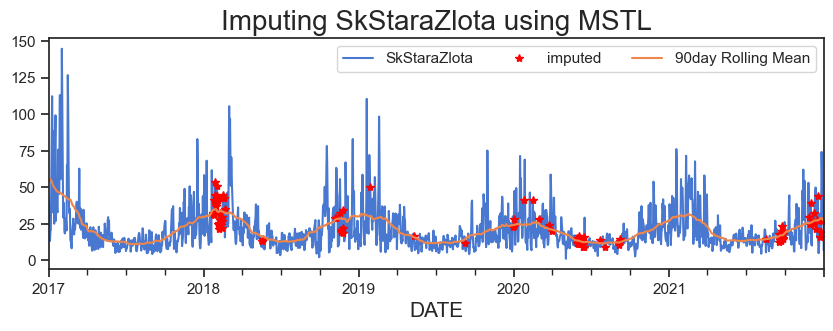

Wall time: 6.55 s


In [78]:
%%time
#Imputing stations between 101 and 363 null values using MSTL
for col in tqdm(pm25_mid_incomplete):
    pm25_stations[col] = impute_with_MSTL(df=pm25_stations, col=col, use_resid=False)

In [79]:
#Filtering those abbrevations that has multiple stations and those stations that are in 
#pm25_high_incomplete variable.
#Among the filtered stations, we are only filtering those stations that are close to each other 
#to combine the measurements.
#Finally, save the result as a dictinary where each abbreviation is the key and the correspnding stations
#is saved as a list.

nearby_pm25_stns_high_nulls_dict=\
station_groups.loc[
    station_groups['stn_abbrv_count'].gt(1) & 
    station_groups['POLSTID'].isin(pm25_high_incomplete)
].groupby('station_abbrev').filter(lambda x: len(x) > 1)[['station_abbrev', 'POLSTID']].\
    groupby('station_abbrev')['POLSTID'].apply(list).to_dict()

nearby_pm25_stns_high_nulls_dict

{'DsLeg': ['DsLegAlRzecz', 'DsLegPolarna'],
 'KpByd': ['KpBydBerling', 'KpBydFieldor'],
 'LbChel': ['LbChelJagiel', 'LbChelPolan'],
 'MpKrak': ['MpKrakBujaka', 'MpKrakOsPias'],
 'MzWar': ['MzWarKondrat', 'MzWarTolstoj'],
 'SkKiel': ['SkKielJagiel', 'SkKielTargow'],
 'WpPozn': ['WpPoznDabrow', 'WpPoznPolank']}

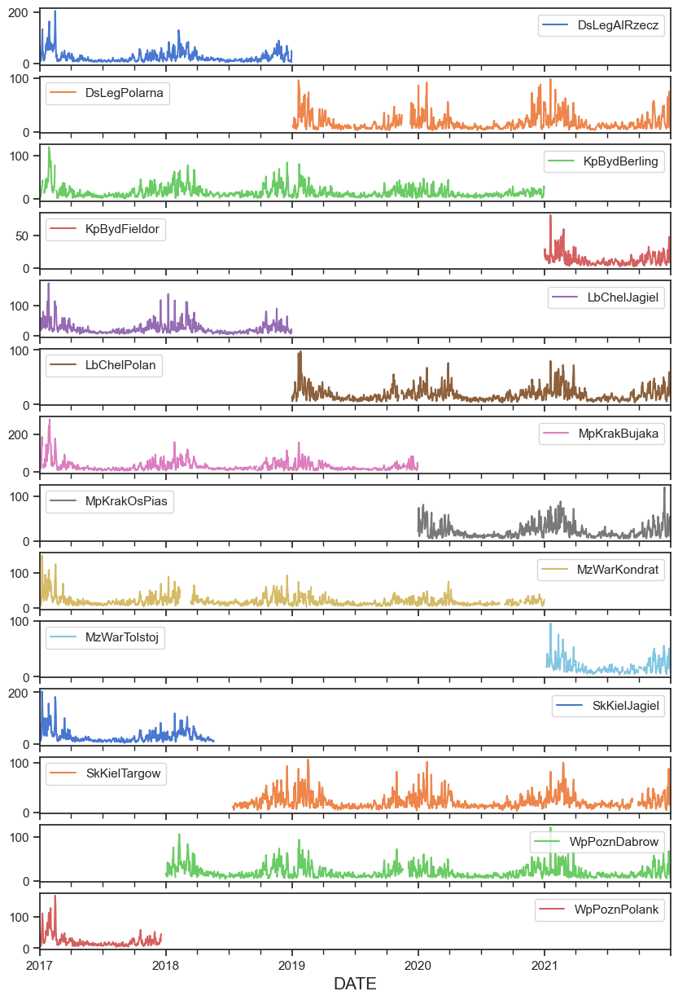

In [80]:
pm25_stations[[
    val for sublist in nearby_pm25_stns_high_nulls_dict.values() for val in sublist
]].plot(subplots=True, figsize=(10, 15));

  0%|          | 0/7 [00:00<?, ?it/s]

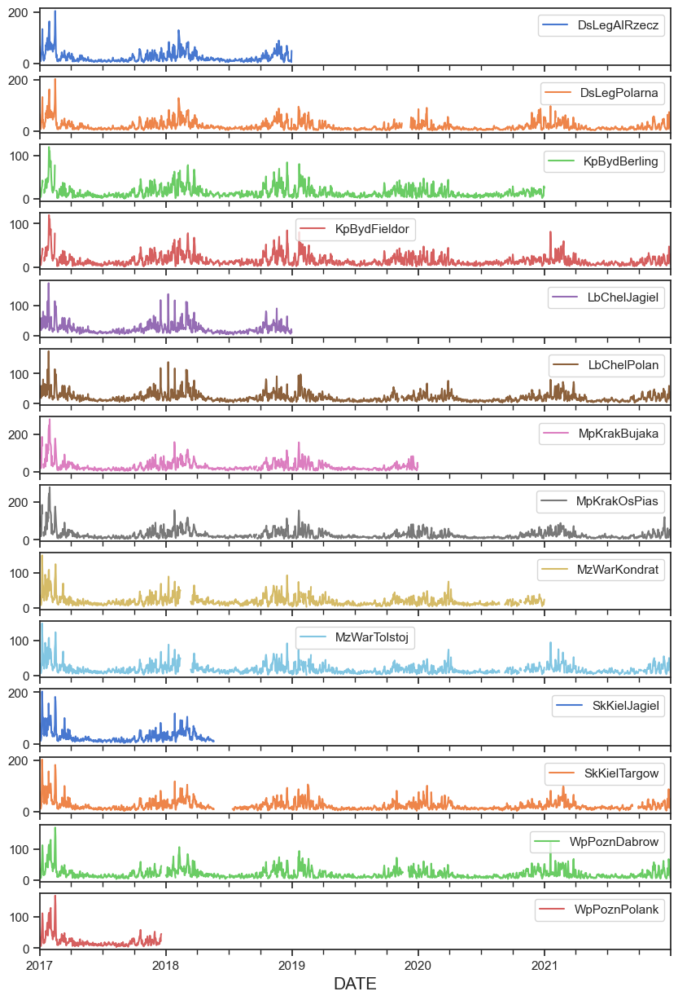

In [81]:
for val in tqdm(nearby_pm25_stns_high_nulls_dict.values()):
    pm25_stations[val] = impute_by_combining(df=pm25_stations, val=val)
    
pm25_stations[[
    val for sublist in nearby_pm25_stns_high_nulls_dict.values() for val in sublist
]].plot(subplots=True, figsize=(10, 15));

In [82]:
grouped_combined_stns=\
pm25_stations[[
    val for sublist in nearby_pm25_stns_high_nulls_dict.values() for val in sublist
]].groupby(pm25_stations.index.year).apply(lambda x: x.notnull().sum()).T

#These combined stations have latest measurements and dont have a large gap of missing values, 
#so only these will be imputed with MSTL
combined_pm25_stns_to_impute = \
grouped_combined_stns[
    grouped_combined_stns[2021].ne(0)
].index

combined_pm25_stns_to_impute

Index(['DsLegPolarna', 'KpBydFieldor', 'LbChelPolan', 'MpKrakOsPias',
       'MzWarTolstoj', 'SkKielTargow', 'WpPoznDabrow'],
      dtype='object', name='POLSTID')

In [83]:
pm25_stations[combined_pm25_stns_to_impute].isnull().sum()

POLSTID
DsLegPolarna    37
KpBydFieldor     6
LbChelPolan      7
MpKrakOsPias    21
MzWarTolstoj    89
SkKielTargow    76
WpPoznDabrow    43
dtype: int64

  0%|          | 0/7 [00:00<?, ?it/s]

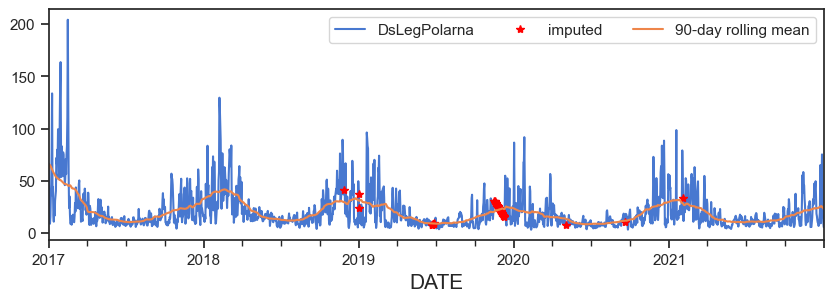

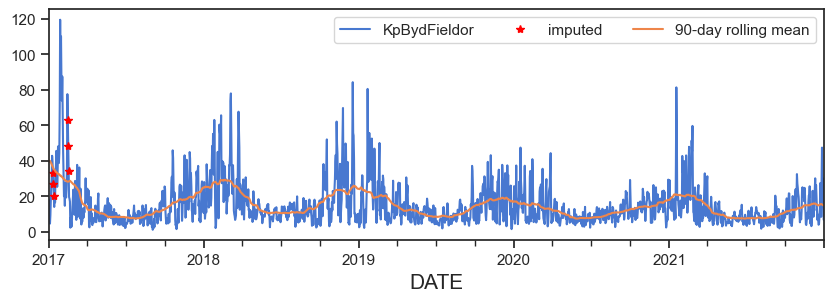

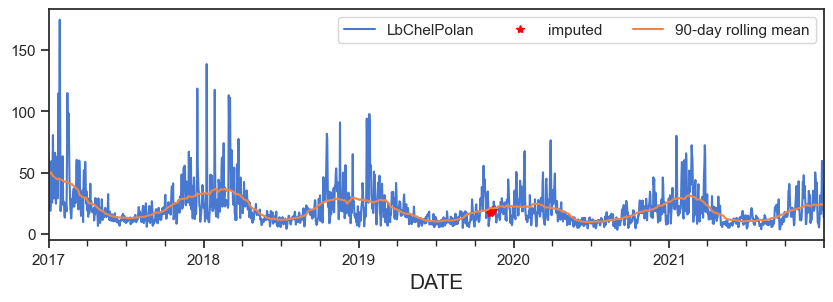

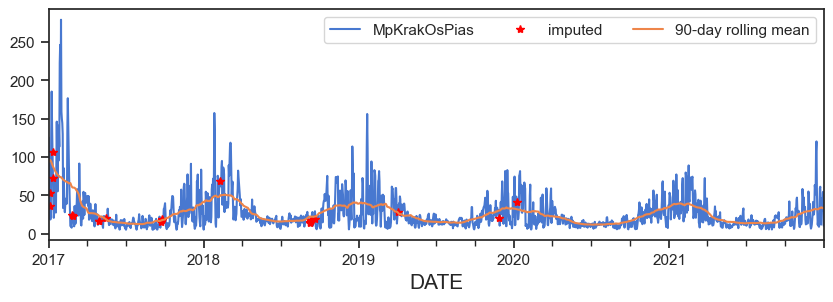

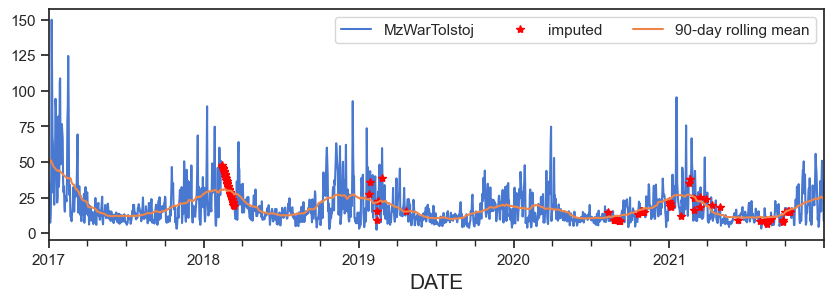

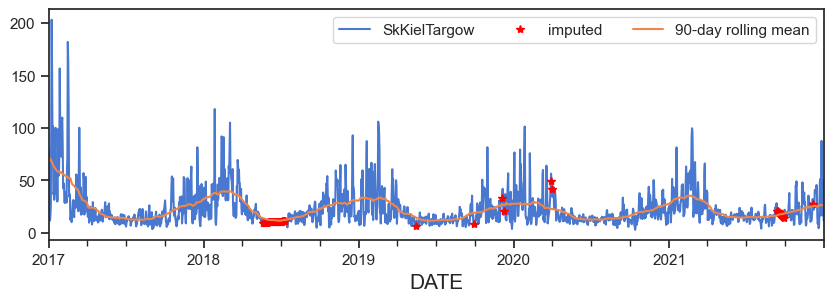

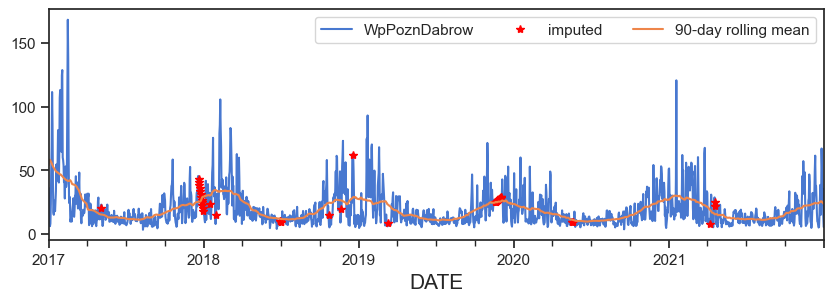

Wall time: 1.58 s


In [84]:
%%time
#Imputing combined station using linear interpolation
for col in tqdm(combined_pm25_stns_to_impute):

    null_values=pm25_stations[col].isnull()
    pm25_stations[col] = pm25_stations[col].interpolate('linear', limit_direction='both')

    plot_simple_impute(df=pm25_stations, col=col, null_val=null_values)

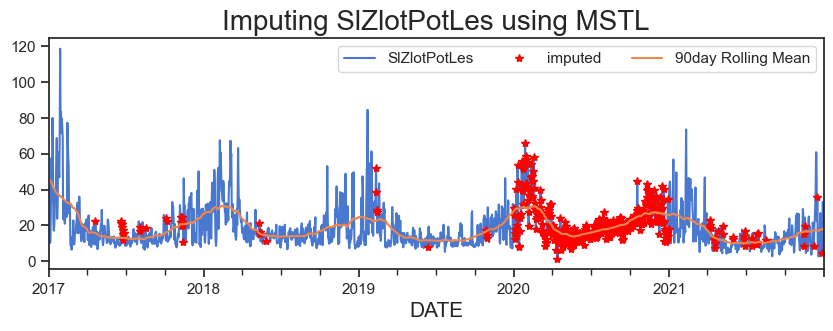

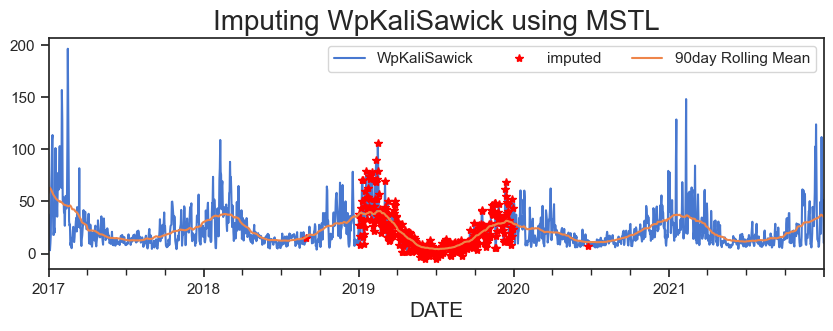

In [85]:
#Two more stations that are not among the combined stations but has missing value for a year in the middle.
for col in ['SlZlotPotLes', 'WpKaliSawick']:
    pm25_stations[col] = impute_with_MSTL(df=pm25_stations, col=col)

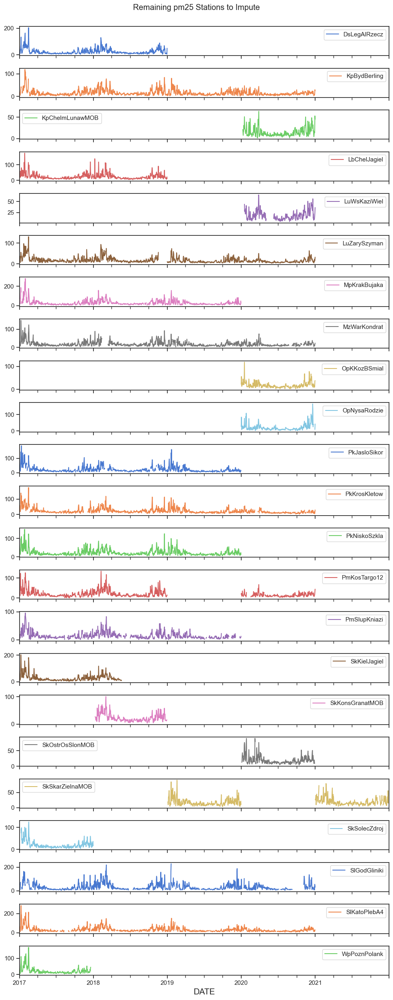

In [86]:
#Saving the remaining stations with large gaps and missing values either for entire 2017 or 2021
remaining_pm25_stns_to_impute = \
pm25_stations.isnull().sum()[pm25_stations.isnull().sum()!=0].index

pm25_stations[remaining_pm25_stns_to_impute].plot(subplots=True, figsize=(10, 25));
plt.suptitle("Remaining pm25 Stations to Impute",  y=1)
plt.tight_layout();

In [87]:
print(f"Remining PM25 Stations to impute: {len(remaining_pm25_stns_to_impute)}")

Remining PM25 Stations to impute: 23


#### Remaining PM2.5 stations to impute reduced  from 79 to 23

# Creating a column to indicate imputation status

In [88]:
pollutant_cols = [
    'NO2_24H_AVG_POLLUTION', 'O3_24H_AVG_POLLUTION', 'PM10_24H_AVG_POLLUTION', 'PM25_24H_AVG_POLLUTION'
]

impute_status_cols = ['NO2_impute_status', 'O3_impute_status', 'PM10_impute_status', 'PM25_impute_status']

In [89]:
#Doing for NO2 seperatly
df.loc[df['POLSTID'].isin(non_no2_stations), 'NO2_impute_status'] = "Not Measured"
df.loc[~df['POLSTID'].isin(non_no2_stations), 'NO2_impute_status'] = "Imputed"

In [90]:
#Marking those cols where no imputation was made for each pollutant
for no_null_cols, non_stns_cols, combined_cols, pending_cols, new_col in zip(
    [no_null_o3_stns, no_null_pm10_stns, no_null_pm25_stns], 
    [non_o3_stations, non_pm10_stations, non_pm25_stations],
    [combined_o3_stns_to_impute, combined_pm10_stns_to_impute, combined_pm25_stns_to_impute],
    [remaining_O3_stns_to_impute, remaining_pm10_stns_to_impute, remaining_pm25_stns_to_impute],
    impute_status_cols[1:]
):
    #No null values, hence no imputation.
    df.loc[df['POLSTID'].isin(no_null_cols), new_col] = "Not Required" 
    
    #the station does not measure that particular polutant
    df.loc[df['POLSTID'].isin(non_stns_cols), new_col] = "Not Measured" 
    
    #Imputed by combining with nearby station for that particular pollutant
    df.loc[df['POLSTID'].isin(combined_cols), new_col] = "Imputed by Combining"
    
    #Imputation is pending due to large gaps
    df.loc[df['POLSTID'].isin(pending_cols), new_col] = "Pending"
    
    #Imputed either using linear interpolation or MSTL
    df.loc[df[new_col].isna(), new_col] = "Imputed"

# Merging with the main Data Frame

In [91]:
df = df.sort_values(["DATE", "POLSTID"], ignore_index=True)

In [92]:
for stns, col in zip([no2_stations, o3_stations, pm10_stations, pm25_stations], pollutant_cols):
    
    temp_df = stns
    temp_stacked = temp_df.stack(dropna=False).reset_index().sort_values(["DATE", "POLSTID"])
    
    temp_stacked['ix'] = df.query("POLSTID in @temp_df.columns").reset_index()['index'].values
    
    df.loc[df['POLSTID'].isin(temp_df.columns), col] = temp_stacked.set_index('ix')[0]

In [93]:
#Final Check
df.groupby('NO2_impute_status')['NO2_24H_AVG_POLLUTION'].apply(lambda x: x.isnull().sum())

NO2_impute_status
Imputed              0
Not Measured    536844
Name: NO2_24H_AVG_POLLUTION, dtype: int64

In [94]:
df.groupby('O3_impute_status')['O3_24H_AVG_POLLUTION'].apply(lambda x: x.isnull().sum())

O3_impute_status
Imputed                      0
Imputed by Combining         0
Not Measured            314072
Not Required                 0
Pending                  36053
Name: O3_24H_AVG_POLLUTION, dtype: int64

In [95]:
df.groupby('PM10_impute_status')['PM10_24H_AVG_POLLUTION'].apply(lambda x: x.isnull().sum())

PM10_impute_status
Imputed                      0
Imputed by Combining         0
Not Measured            120516
Not Required                 0
Pending                  92645
Name: PM10_24H_AVG_POLLUTION, dtype: int64

In [96]:
df.groupby('PM25_impute_status')['PM25_24H_AVG_POLLUTION'].apply(lambda x: x.isnull().sum())

PM25_impute_status
Imputed                      0
Imputed by Combining         0
Not Measured            396242
Not Required                 0
Pending                  22944
Name: PM25_24H_AVG_POLLUTION, dtype: int64

In [103]:
# Imputation Status Summary
for col in impute_status_cols:
    
    no_null_stns_count = len(df.loc[df[col].str.contains(r'^Imputed'), 'POLSTID'].unique())
    pending_stns_count = len(df.loc[df[col].str.contains(r'^Pending'), 'POLSTID'].unique())
    
    pct_stns = no_null_stns_count/(no_null_stns_count+pending_stns_count)
    
    print(f'{col.split("_")[0]} Stations With Non null values: {no_null_stns_count}')
    print(f'{col.split("_")[0]} Stations Pending to be imputed: {pending_stns_count}')
    print(f'Percentage of {col.split("_")[0]} Stations With Non null values: {pct_stns*100:.1f} %')
    print()

NO2 Stations With Non null values: 3
NO2 Stations Pending to be imputed: 0
Percentage of NO2 Stations With Non null values: 100.0 %

O3 Stations With Non null values: 86
O3 Stations Pending to be imputed: 35
Percentage of O3 Stations With Non null values: 71.1 %

PM10 Stations With Non null values: 140
PM10 Stations Pending to be imputed: 89
Percentage of PM10 Stations With Non null values: 61.1 %

PM25 Stations With Non null values: 56
PM25 Stations Pending to be imputed: 23
Percentage of PM25 Stations With Non null values: 70.9 %



# Adding extra features

In [105]:
df2 = pd.read_csv("air_quality_stations_with_powiat_GEOJSON.csv")

In [107]:
df2.columns

Index(['No', 'Station code', 'International code', 'Station name',
       'Old station code', 'Launching date', 'Closing date', 'Station type',
       'Region type', 'Station model', 'Voivodeship', 'City', 'Address',
       'WGS84 φ N', 'WGS84 λ E', 'county', 'STANAME'],
      dtype='object')

In [113]:
full_df = \
df.merge(df2[['Station code', 'Station type', 'Region type', 'Station model']],
         how='left',
         left_on='POLSTID',
         right_on='Station code')

In [115]:
full_df.isnull().sum()

DATE                           0
POLSTID                        0
Voivodeship                    0
City                           0
county                         0
postcode                       0
LAT                            0
LON                            0
NO2_24H_AVG_POLLUTION     536844
O3_24H_AVG_POLLUTION      350125
PM10_24H_AVG_POLLUTION    213161
PM25_24H_AVG_POLLUTION    419186
day                            0
month                          0
year                           0
dayofweek                      0
station_abbrev                 0
NO2_impute_status              0
O3_impute_status               0
PM10_impute_status             0
PM25_impute_status             0
Station code                   0
Station type                   0
Region type                    0
Station model                  0
dtype: int64

In [132]:
full_df.to_csv("air_quality_partial_imputation.csv", index=False)